# **CONFIGURAZIONE AMBIENTE**

* Installazione delle dipendenze, in modo da evitare conflitti di versione
* Importazione delle librerie necessarie
* Caricamento del modello

In [1]:
!pip install -q git+https://github.com/huggingface/transformers.git
!pip install -q librosa soundfile pyloudnorm pydub
!pip install -q demucs noisereduce

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 6.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.1/87.1 kB 4.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.6/59.6 kB 4.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 249.1/249.1 kB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.0/40.0 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.5/75.5 kB 4.1 MB/s eta 0:00:00


In [2]:
import os
import torch
import torchaudio
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import librosa
import soundfile as sf
from scipy import signal
from scipy.signal import iirfilter, sosfilt, butter, filtfilt
from scipy.interpolate import CubicSpline
import noisereduce as nr
import pandas as pd
import random
from tqdm import tqdm
import json
import numpy as np
import librosa.display
from demucs.pretrained import get_model
from demucs.apply import apply_model
from demucs.audio import AudioFile, convert_audio
import seaborn as sns
import shutil
import pyloudnorm as pyln
import csv
from IPython.display import Audio, display
from pydub import AudioSegment
import warnings
warnings.filterwarnings('ignore') # Ignora gli avvisi non critici

/usr/local/lib/python3.12/dist-packages/pydub/utils.py:300: SyntaxWarning: invalid escape sequence '\('
  m = re.match('([su]([0-9]{1,2})p?) \(([0-9]{1,2}) bit\)$', token)
/usr/local/lib/python3.12/dist-packages/pydub/utils.py:301: SyntaxWarning: invalid escape sequence '\('
  m2 = re.match('([su]([0-9]{1,2})p?)( \(default\))?$', token)
/usr/local/lib/python3.12/dist-packages/pydub/utils.py:310: SyntaxWarning: invalid escape sequence '\('
  elif re.match('(flt)p?( \(default\))?$', token):
/usr/local/lib/python3.12/dist-packages/pydub/utils.py:314: SyntaxWarning: invalid escape sequence '\('
  elif re.match('(dbl)p?( \(default\))?$', token):


# **GENERAZIONE DATASET CON MUSICGEN**

Il __dataset__ viene generato attraverso questi passaggi:
1. Vengono creati, a partire da generi musicali, dei prompt bilanciati combinando strumenti, tipi vocali e mood
2. I prompt vengono trasformati in audio grazie al modello preaddestrato di MusicGen
3. Ogni campione audio generato viene salvato come file WAV con metadati completi a esso riferiti
4. Tutti i metadati vengono salvati in un file JSON per le analisi successive

In [3]:
from transformers import AutoProcessor, MusicgenForConditionalGeneration

In [4]:
''' Creazione del dataset '''
class Config:
    SAMPLE_RATE = 32000  # Frequenza di campionamento (in Hz)
    DURATION = 7  # Durata di ogni brano (in secondi)
    TOTAL_SAMPLES = 15  # Numero totale di campioni
    MODEL_SIZE = "small"  # Usa la versione "small" di MusicGen
    OUTPUT_DIR = "musicgen_dataset"  # Cartella che conterrà il dataset generato
    METADATA_FILE = "metadata.json"  # Nome del file che conterrà tutte le informazioni associate ad un determinato file audio

    # Generazione casuale degli audio, per ogni genere genera una lista di template
    GENRES = ["pop", "rock", "lofi", "electronic", "hip-hop"]
    INSTRUMENTS = ["piano", "guitar", "synth", "drums"]
    MOODS = ["happy", "sad", "calm", "energetic", "dark"]

    TEMPLATES = {
    'pop': ["{mood} pop song with {instr}", "{mood} {instr} pop track"],
    'rock': ["{mood} rock song with {instr}", "{mood} {instr} rock music"],
    'lofi': ["{mood} lofi beat with {instr}", "{mood} {instr} lofi chill"],
    'electronic': ["{mood} electronic track with {instr}", "{mood} {instr} electronic music"],
    'hip-hop': ["{mood} hip-hop beat with {instr}", "{mood} {instr} hip-hop instrumental"]
    }

In [5]:
''' Genera un DataFrame con prompt bilanciati per genere '''
def generate_balanced_prompts(n_samples: int) -> pd.DataFrame:
    prompts = []
    samples_per_genre = max(1, n_samples // len(Config.GENRES))  # Calcola il numero di campioni per ogni genere

    # Per ogni genere, itera sui template di quest'ultimo
    for genre in Config.GENRES:
        genre_prompts = []
        templates = Config.TEMPLATES[genre]

        for _ in range(samples_per_genre):
            template = random.choice(templates)
            prompt = template.format(
                instr=random.choice(Config.INSTRUMENTS),
                mood=random.choice(Config.MOODS)
            )
            # Aggiunge il prompt generato con metadati aggiuntivi
            genre_prompts.append({
                "prompt": prompt,
                "genre": genre,
                "mood": random.choice(Config.MOODS)
            })

        # Aggiunge i prompt del genere alla lista totale
        prompts.extend(genre_prompts[:samples_per_genre])

    # Converte la lista in Dataframe pandas
    return pd.DataFrame(prompts[:n_samples])

In [6]:
''' Crea la cartella che conterrà il dataset '''
def create_directory_structure():
    os.makedirs(Config.OUTPUT_DIR, exist_ok=True)
    print(f"📁 Cartella '{Config.OUTPUT_DIR}' creata")

In [7]:
''' Classe per generare audio '''
class AudioDatasetGenerator:
    def __init__(self):
        print("Caricamento del modello MusicGen (Transformers)...")
        self.processor = AutoProcessor.from_pretrained(f"facebook/musicgen-{Config.MODEL_SIZE}")  # Carica il processore
        self.model = MusicgenForConditionalGeneration.from_pretrained(f"facebook/musicgen-{Config.MODEL_SIZE}")  # Carica il modello MusicGen preaddestrato

        # Sposta il modello sulla GPU se disponibile, altrimenti usa CPU
        self.device = "cuda" if torch.cuda.is_available() else "cpu"
        self.model.to(self.device)
        print(f"✅ Modello caricato su {self.device}!")

    ''' Genera audio da un prompt '''
    def generate_audio(self, prompt: str) -> np.ndarray:
        # Prepara l'input per il modello convertendo il testo
        inputs = self.processor(
            text=[prompt],
            padding=True,
            return_tensors="pt",
        ).to(self.device)

        # Calcola il numero di token necessario per la durata desiderata
        max_new_tokens = int(Config.DURATION * 50)

        # Genera l'audio attraverso il metodo dell'inferenza
        with torch.no_grad():
            audio_values = self.model.generate(
                **inputs,
                do_sample=True,
                guidance_scale=3.0,
                max_new_tokens=max_new_tokens
            )

        # Estrae l'audio e converte in numpy array
        audio_array = audio_values[0, 0].cpu().numpy()

        # Calcola il numero di campioni desiderato
        target_samples = int(Config.DURATION * Config.SAMPLE_RATE)

        # Taglia l'array audio alla durata esatta
        if len(audio_array) > target_samples:
            audio_array = audio_array[:target_samples]

        # Normalizza l'audio pr evitare il clipping
        audio_array = audio_array / np.max(np.abs(audio_array))
        return audio_array

    ''' Salva l'audio nella cartella del dataset '''
    def save_audio(self, audio: np.ndarray, filename: str):
        output_path = os.path.join(Config.OUTPUT_DIR, filename)

        # Converte l'array numpy in tensore PyTorch e aggiunge dimensione canale
        audio_tensor = torch.FloatTensor(audio).unsqueeze(0)
        torchaudio.save(output_path, audio_tensor, Config.SAMPLE_RATE)

        return output_path  # Restituisce il percorso del file

    ''' Genera tutti gli audio dal DataFrame di prompt '''
    def generate_dataset(self, df: pd.DataFrame):
        metadata = []

        for idx, row in tqdm(df.iterrows(), total=len(df), desc="Generazione audio"):
            try:
                # Genera audio dal prompt corrente
                audio = self.generate_audio(row['prompt'])

                # Crea un nome file univoco con indice e genere
                filename = f"audio_{idx:03d}_{row['genre']}.wav".replace(" ", "_")

                # Salva l'audio e ottiene il percorso del file
                filepath = self.save_audio(audio, filename)

                # Aggiunge i metadati del file alla lista vuota creata all'iniziio
                metadata.append({
                    "filename": filename,
                    "filepath": filepath,
                    "prompt": row['prompt'],
                    "genre": row['genre'],
                    "duration": Config.DURATION,
                    "sample_rate": Config.SAMPLE_RATE
                })

            except Exception as e:
                print(f"❌ Errore generazione sample {idx}: {str(e)}")
                continue

        return metadata

In [8]:
def main():
    print("➡️Inizio generazione dataset: ")

    # Crea la struttura delle cartelle
    create_directory_structure()

    # Genera i prompt bilanciati
    prompts_df = generate_balanced_prompts(Config.TOTAL_SAMPLES)
    print(f"Generati {len(prompts_df)} prompt")

    # Genera gli audio
    print("\n🔊 Generazione dei campioni audio...")
    generator = AudioDatasetGenerator()
    metadata = generator.generate_dataset(prompts_df)

    # Salva i metadati
    metadata_path = os.path.join(Config.OUTPUT_DIR, Config.METADATA_FILE)

    # Aggiunge vocal_type e mood a ogni elemento dei metadati
    enhanced_metadata = []
    for i, item in enumerate(metadata):
        enhanced_item = item.copy()
        if i < len(prompts_df):
            # enhanced_item['vocal_type'] = str(prompts_df.iloc[i]['vocal_type'])
            enhanced_item['mood'] = str(prompts_df.iloc[i]['mood'])
        enhanced_metadata.append(enhanced_item)

    with open(metadata_path, 'w') as f:
        json.dump(enhanced_metadata, f, indent=2)

    # Statistiche finali
    print(f"\n✅ Dataset generato con successo")
    print(f"📊 Totale campioni: {len(enhanced_metadata)}")
    print(f"📁 Cartella: '{Config.OUTPUT_DIR}/'")
    print(f"    Metadati: '{metadata_path}'")

    # Audio dei primi 3 campioni
    print(f"\n ASCOLTO DEI PRIMI 3 CAMPIONI:")
    print("=" * 50)

    for i, item in enumerate(enhanced_metadata[:3]):
        print(f"\n{i+1}. {item['prompt']}")
        print(f"   Genere: {item['genre']}")
        # print(f"   Tipo vocale: {item['vocal_type']}")
        print(f"   Mood: {item['mood']}")
        print(f"   File: {item['filename']}")

        try:
            # Carica l'audio
            audio, sr = torchaudio.load(item['filepath'])
            print(f"   Durata: {audio.shape[1] / sr:.1f}s")

            # Riproduzione audio
            from IPython.display import Audio, display
            display(Audio(audio.numpy(), rate=sr))

        except Exception as e:
            print(f"   ❌ Errore caricamento audio: {str(e)}")

if __name__ == "__main__":
    main()

➡️Inizio generazione dataset: 
📁 Cartella 'musicgen_dataset' creata
Generati 15 prompt

🔊 Generazione dei campioni audio...
Caricamento del modello MusicGen (Transformers)...


preprocessor_config.json:   0%|          | 0.00/275 [00:00<?, ?B/s]

Fetching 1 files:   0%|          | 0/1 [00:00<?, ?it/s]

Fetching 1 files:   0%|          | 0/1 [00:00<?, ?it/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

spiece.model:   0%|          | 0.00/792k [00:00<?, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json: 0.00B [00:00, ?B/s]

config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/2.36G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/224 [00:00<?, ?B/s]

✅ Modello caricato su cuda!


Generazione audio: 100%|██████████| 15/15 [02:06<00:00,  8.42s/it]


✅ Dataset generato con successo
📊 Totale campioni: 15
📁 Cartella: 'musicgen_dataset/'
    Metadati: 'musicgen_dataset/metadata.json'

 ASCOLTO DEI PRIMI 3 CAMPIONI:

1. energetic synth pop track
   Genere: pop
   Mood: energetic
   File: audio_000_pop.wav
   Durata: 6.9s



2. calm pop song with synth
   Genere: pop
   Mood: sad
   File: audio_001_pop.wav
   Durata: 6.9s



3. dark pop song with piano
   Genere: pop
   Mood: sad
   File: audio_002_pop.wav
   Durata: 6.9s


# **Valutazione dataset prima dell'enhancement**


ANALISI DELLA QUALITÀ AUDIO ORIGINALE
 Analisi della qualità audio del dataset...


Analisi file audio: 100%|██████████| 15/15 [00:12<00:00,  1.19it/s]


📊 Statistiche aggregate salvate in: musicgen_dataset/musicgen_quality_stats.json

 RISULTATI ANALISI QUALITÀ BASELINE:

📊 Statistiche generali:
   Numero campioni analizzati: 15
   Loudness medio: -16.66 LUFS
   SNR medio: 8.77 dB
   Frequenza massima media: 15180.21 Hz

🔴 Loudness per genere:
   pop: -18.13 LUFS
   rock: -14.10 LUFS
   lofi: -17.88 LUFS
   electronic: -17.32 LUFS
   hip-hop: -15.88 LUFS

🔴 SNR per genere:
   pop: 2.19 dB
   rock: 3.19 dB
   lofi: 15.46 dB
   electronic: 10.39 dB
   hip-hop: 12.64 dB

🔴 Frequenze massime significative:
   pop: 15833.33 Hz
   rock: 15588.54 Hz
   lofi: 15140.62 Hz
   electronic: 13911.46 Hz
   hip-hop: 15427.08 Hz


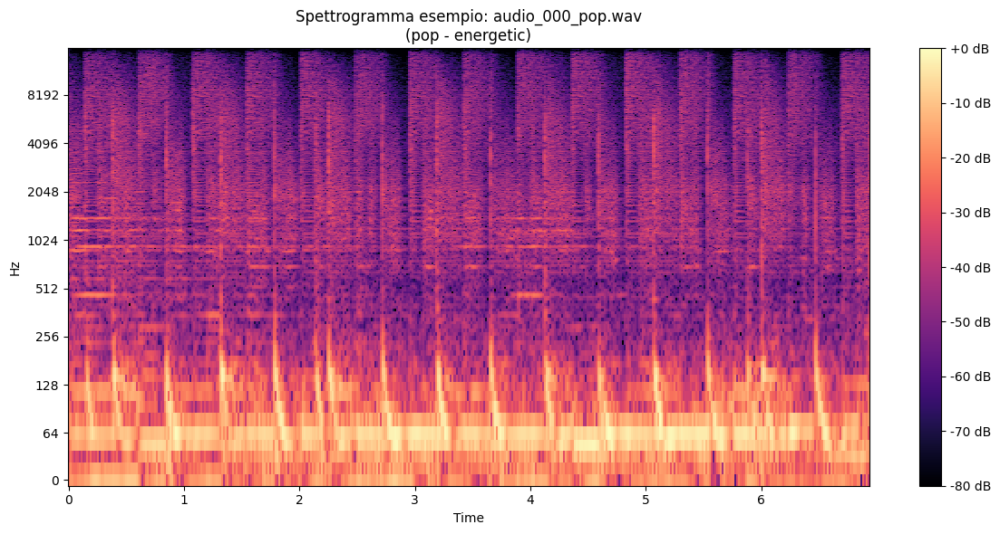


📊 Problemi comuni riscontrati:
   - Loudness troppo basso: 2 file
   - SNR basso (< 5 dB): 6 file
   - Frequenze limitate (< 10 kHz): 0 file

✅ Analisi completata! Report dettagliato salvato in: musicgen_dataset/musicgen_quality_report.json


In [9]:
def analyze_audio_quality(filepath):
    y, sr = librosa.load(filepath, sr=None)
    duration = librosa.get_duration(y=y, sr=sr)

    # Calcola il loudness (LUFS)
    meter = pyln.Meter(sr)
    loudness = meter.integrated_loudness(y)

    # Stima del rumore (usa i primi 1000 campioni come rumore di fondo)
    noise_estimate = np.std(y[:1000])
    signal_estimate = np.std(y)  # Stima del segnale completo
    # Calcola SNR (evitando divisione per zero)
    if noise_estimate > 0:
        snr_estimate = 20 * np.log10(signal_estimate / noise_estimate)
    else:
        snr_estimate = float('inf')  # SNR infinito se non c'è rumore

    # Calcola lo spettro per vedere il roll-off delle alte frequenze
    stft = np.abs(librosa.stft(y))
    freq_energy = np.mean(stft, axis=1)

    # Calcola la frequenza massima significativa (dove l'energia scende sotto una soglia)
    freqs = librosa.fft_frequencies(sr=sr)
    energy_db = 10 * np.log10(freq_energy + 1e-10)
    max_energy = np.max(energy_db)
    # Trova dove l'energia scende di 40dB rispetto al picco
    threshold = max_energy - 40
    significant_freq_idx = np.where(energy_db > threshold)[0]
    max_significant_freq = freqs[significant_freq_idx[-1]] if len(significant_freq_idx) > 0 else 0

    return {
        "filename": os.path.basename(filepath),
        "duration": float(duration),
        "loudness_lufs": float(loudness),
        "snr_estimate_db": float(snr_estimate) if snr_estimate != float('inf') else None,
        "max_significant_frequency_hz": float(max_significant_freq),
        "sample_rate": int(sr)
    }


''' Funzione per analizzare tutto il dataset '''
def analyze_dataset_quality(metadata_path):
    # Carica i metadati
    with open(metadata_path, 'r') as f:
        metadata = json.load(f)

    results = []

    print(" Analisi della qualità audio del dataset...")
    for item in tqdm(metadata, desc="Analisi file audio"):
        try:
            analysis = analyze_audio_quality(item['filepath'])
            # Aggiungi i metadati originali
            analysis.update({
                'prompt': item['prompt'],
                'genre': item['genre'],
                'mood': item['mood']
            })
            results.append(analysis)
        except Exception as e:
            print(f"❌ Errore nell'analisi di {item['filename']}: {str(e)}")
            continue

    return results


''' Funzione per visualizzare i risultati e salvare le statistiche '''
def visualize_quality_analysis(results, stats_filename="musicgen_quality_stats.json"):
    # Crea DataFrame dai risultati
    df = pd.DataFrame(results)

    # Calcola le statistiche
    stats = {
        "general_stats": {
            "num_samples": len(df),
            "mean_loudness_lufs": float(df['loudness_lufs'].mean()),
            "mean_snr_estimate_db": float(df['snr_estimate_db'].mean()),
            "mean_max_significant_frequency_hz": float(df['max_significant_frequency_hz'].mean())
        },
        "loudness_by_genre": {},
        "snr_by_genre": {},
        "freq_by_genre": {},
        "common_issues": {
            "low_loudness_count": int(len(df[df['loudness_lufs'] < -20])),
            "low_snr_count": int(len(df[df['snr_estimate_db'] < 5])),
            "limited_freq_count": int(len(df[df['max_significant_frequency_hz'] < 10000]))
        }
    }

    # Popola le statistiche per genere
    for genre in df['genre'].unique():
        genre_data = df[df['genre'] == genre]
        stats["loudness_by_genre"][genre] = float(genre_data['loudness_lufs'].mean())
        stats["snr_by_genre"][genre] = float(genre_data['snr_estimate_db'].mean())
        stats["freq_by_genre"][genre] = float(genre_data['max_significant_frequency_hz'].mean())

    # Salva le statistiche in JSON
    stats_path = os.path.join(Config.OUTPUT_DIR, stats_filename)
    with open(stats_path, 'w') as f:
        json.dump(stats, f, indent=2)
    print(f"📊 Statistiche aggregate salvate in: {stats_path}")

    print("\n RISULTATI ANALISI QUALITÀ BASELINE:")
    print("=" * 50)

    # Statistiche generali
    print(f"\n📊 Statistiche generali:")
    print(f"   Numero campioni analizzati: {stats['general_stats']['num_samples']}")
    print(f"   Loudness medio: {stats['general_stats']['mean_loudness_lufs']:.2f} LUFS")
    print(f"   SNR medio: {stats['general_stats']['mean_snr_estimate_db']:.2f} dB")
    print(f"   Frequenza massima media: {stats['general_stats']['mean_max_significant_frequency_hz']:.2f} Hz")

    # Loudness per genere
    print(f"\n🔴 Loudness per genere:")
    for genre, loudness in stats['loudness_by_genre'].items():
        print(f"   {genre}: {loudness:.2f} LUFS")

    # SNR per genere
    print(f"\n🔴 SNR per genere:")
    for genre, snr in stats['snr_by_genre'].items():
        print(f"   {genre}: {snr:.2f} dB")

    # Frequenze massime
    print(f"\n🔴 Frequenze massime significative:")
    for genre, freq in stats['freq_by_genre'].items():
        print(f"   {genre}: {freq:.2f} Hz")

    # Esempio di spettrogramma per un campione
    if len(results) > 0:
        sample_file = results[0]['filename']
        sample_path = os.path.join(Config.OUTPUT_DIR, sample_file)
        y, sr = librosa.load(sample_path, sr=None)

        plt.figure(figsize=(12, 6))

        D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
        img = librosa.display.specshow(D, y_axis='log', x_axis='time', sr=sr)
        plt.title(f'Spettrogramma esempio: {sample_file}\n({results[0]["genre"]} - {results[0]["mood"]})')
        plt.colorbar(format='%+2.0f dB')
        plt.tight_layout()
        plt.show()

    # Problemi comuni
    print(f"\n📊 Problemi comuni riscontrati:")
    print(f"   - Loudness troppo basso: {stats['common_issues']['low_loudness_count']} file")
    print(f"   - SNR basso (< 5 dB): {stats['common_issues']['low_snr_count']} file")
    print(f"   - Frequenze limitate (< 10 kHz): {stats['common_issues']['limited_freq_count']} file")

    return df, stats


print("\n" + "="*60)
print("ANALISI DELLA QUALITÀ AUDIO ORIGINALE")
print("="*60)

# Percorso al file dei metadati
metadata_path = os.path.join(Config.OUTPUT_DIR, Config.METADATA_FILE)

# Analizza la qualità del dataset
quality_results = analyze_dataset_quality(metadata_path)

# Visualizza i risultati e salva le statistiche
quality_df, aggregate_stats = visualize_quality_analysis(quality_results)

# Salva i risultati dell'analisi dettagliata
original_quality_report_path = os.path.join(Config.OUTPUT_DIR, 'musicgen_quality_report.json')
with open(original_quality_report_path, 'w') as f:
    json.dump(quality_results, f, indent=2)

print(f"\n✅ Analisi completata! Report dettagliato salvato in: {original_quality_report_path}")

# **ENHANCEMENT CON DSP**

* __DECLIPPING__: Il __Clipping__ è la distorsione di una forma d'onda alternata di un segnale elettrico, si verifica quando il volume di un segnale audio supera il limite che un sistema può gestire (di solito 0 dB). Tutte le creste del segnale al di sopra di questo valore vengono quindi tagliate, generando una distorsione dell'audio.

     La funzione __declip_audio__ identifica i campioni che superano una soglia e, invece di tagliarli, cerca di ricostruire la parte dell'onda che è stata tagliata attraverso l'__interpolazione cubica__.
* __BANDWIDTH EXTENSION__: la funzione __bandwidth_extension__, cerca di sintetizzare, attraverso una tecnica zero shot (__spectral grafting__), le frequenze mancanti.
* __EQUALIZZAZIONE ADATTIVA__: analizza l'audio e lo equalizza in maniera personalizzata, senza l'utilizzo di filtri preimpostati.

     Si basa su due metriche: __il centroide spettrale__ e la __planarità spettrale__.
* __LIMITER MULTIBANDA__: applica una compressione su delle frequenze per cercare di prevenire una distorsione a causa del clipping. Lavora in modo selettivo, comprimendo quanto necessario tra bassi, medi e alti.
* __NORMALIZZAZIONE DEL VOLUME__: utilizza il __misuratore LUFS__ per calcolare la loudness integrata (come viene percepito il volume medio) e poi, attraverso una normalizzazione, la confronta con un __target LUFS__. Cerca di rendere il volume dell'intero brano costante.
* __AUDIO EXCITER__: aggiunge brillantezza e nitidezza aumentando il volume delle alte frequenze
* __HIGH FREQUENCIES BOOST__: aumenta il volume delle frequenze acute, utilizzando un filtro shelving

In [10]:
''' Correzione avanzata del clipping con interpolazione cubica -> identifica i sample clippati e li ricostruisce '''
def declip_audio(y, threshold=0.95):
    # Trova gli indici dei sample che superano la soglia di clipping
    clipped_samples = np.where(np.abs(y) > threshold)[0]

    # Se non ci sono sample clippati, restituisce l'audio originale
    if len(clipped_samples) == 0:
        return y

    # Numero di sample clippati
    print(f"   Correzione di {len(clipped_samples)} sample clippati")

    # Crea una maschera booleana dove True = sample validi, False = sample clippati
    valid_mask = np.ones(len(y), dtype=bool) # Inizialmente considera tutti i valori validi
    valid_mask[clipped_samples] = False # Poi cambia il valore da True a False per tutti i valori clippati

    # Prepara gli assi per l'interpolazione
    x = np.arange(len(y))
    # Crea una curva CubicSpline che passi attraverso i sample validi (ignora i punti clippati)
    cs = CubicSpline(x[valid_mask], y[valid_mask])
    # Ora usa la curva per calcolare un valore per ogni singolo punto dell'audio (compresi quelli clippati)
    # generando un nuovo segnale in cui le parti clippate hanno un valore
    y_declipped = cs(x)

    # Sostituisci i sample interpolati con quelli originali dove erano già validi
    y_declipped[valid_mask] = y[valid_mask]

    return y_declipped


''' Estensione zero-shot della banda audio usando spectral grafting -> genera sinteticamente le alte frequenze mancanti '''
def bandwidth_extension(y, sr, target_bandwidth=16000):
    # Calcola la frequenza di Nyquist (metà del sample rate)
    # è la massima frequenza che può essere rappresentata digitalmente in un segnale
    nyquist = sr // 2

    # Se la banda target è minore o uguale a Nyquist, non serve estensione
    if target_bandwidth <= nyquist:
        return y

    print(f"   Estensione banda: {nyquist}Hz → {target_bandwidth}Hz")

    # Parametri per la STFT (Short-Time Fourier Transform) -> trasforma il segnale dal dominio del tempo al dominio della frequenza
    n_fft = 2048  # Dimensione della finestra FFT
    hop_length = n_fft // 4  # Overlap tra le finestre (75%)

    # Calcola la STFT per ottenere magnitudini e fasi
    S = librosa.stft(y, n_fft=n_fft, hop_length=hop_length)
    magnitudes = np.abs(S)
    phases = np.angle(S)

    # Calcola quanti bin FFT servono per coprire la tarfet bandwidth
    new_bins = int((target_bandwidth / nyquist) * (n_fft // 2 + 1))
    # Crea una nuova matrice per le magnitudini estese
    extended_magnitudes = np.zeros((new_bins, magnitudes.shape[1]), dtype=np.float32)

    # Copia le frequenze originali nella parte bassa del nuovo spettro
    extended_magnitudes[:magnitudes.shape[0], :] = magnitudes

    # Genera sinteticamente le alte frequenze mancanti
    for bin_idx in range(magnitudes.shape[0], new_bins):
        # Calcola un fattore di riduzione per l'ampiezza
        decay = np.exp(-2.0 * (bin_idx - magnitudes.shape[0]) / magnitudes.shape[0])

        # Trova una frequenza di riferimento più bassa nelle frequenze originali (scala logaritmica)
        ref_bin = int(magnitudes.shape[0] * 0.7 * (1 - np.log(1 + bin_idx - magnitudes.shape[0])))
        ref_bin = max(0, min(ref_bin, magnitudes.shape[0] - 1))

        # Calcola il valore della magnitudine del nuovo bin
        extended_magnitudes[bin_idx, :] = magnitudes[ref_bin, :] * decay

    # Ricostruisce lo spettro complesso con le nuove magnitudini e fasi originali
    S_extended = extended_magnitudes * np.exp(1j * phases)
    # Esegue la trasformata inversa per tornare al dominio del tempo
    y_extended = librosa.istft(S_extended, hop_length=hop_length, length=len(y))

    return y_extended


'''Equalizzazione adattiva basata sul contenuto spettrale del segnale '''
def adaptive_equalization(y, sr):
    try:
        # Calcola il centroide spettrale (centro di massa dello spettro)
        # < 1200 Hz indica un suono "scuro", > 2500 Hz indica un suono "brillante"
        spectral_centroid = np.mean(librosa.feature.spectral_centroid(y=y, sr=sr))

        # Calcola la planarità spettrale (quanto lo spettro è rumoroso vs tonale)
        # vicino a 1 indica energia distribuita in modo uniforme, vicino a 0 indica energia concentrata in poche frequenze
        spectral_flatness = np.mean(librosa.feature.spectral_flatness(y=y))

        print(f"   Analisi spettrale: centroid={spectral_centroid:.0f}Hz, flatness={spectral_flatness:.3f}")

        # Applica equalizzazione basata sul centroide spettrale
        if spectral_centroid < 1200:  # Assume suono scuro (basse frequenze dominanti)
            # Boost delle frequenze medio-alte (800-5000 Hz)
            b, a = signal.butter(4, [800/(sr/2), 5000/(sr/2)], btype='bandpass')
            y_boost = signal.filtfilt(b, a, y)
            y_eq = y + 0.25 * y_boost  # 75% originale + 25% frequenze boostate -> ne risulta un suono più chiaro

        elif spectral_centroid > 2500:  # Assume uono brillante (alte frequenze dominanti)
            # Leggera attenuazione delle alte frequenze (>6000 Hz)
            b, a = signal.butter(4, 6000/(sr/2), btype='lowpass')
            y_eq = signal.filtfilt(b, a, y)
            y_eq = 0.7 * y + 0.3 * y_eq  # 70% originale + 30% filtrato -> rende il suono meno aspro

        else:  # Se bilanciato non corregge
            y_eq = y

        return y_eq

    except Exception as e:
        print(f"   ⚠️ Equalizzazione saltata: {e}")
        return y


''' Limiter multibanda '''
def multiband_limiter(y, sr, thresholds=[-3.0, -2.0, -1.0], ratios=[4, 6, 8]):
    try:
        # Tre bande di frequenza: bassi, medi, alti
        bands = [
            (50, 300),
            (300, 3000),
            (3000, 10000)
        ]

        # Inizializza l'audio limitato
        y_limited = np.zeros_like(y)

        # Processa ogni banda separatamente
        for i, (low_freq, high_freq) in enumerate(bands):
            # Controlla se la banda è entro il range di Nyquist
            if high_freq < sr//2:
                # Crea un filtro passa-banda per la banda corrente -> isola la banda di frequenze dell'audio originale
                b, a = signal.butter(4, [low_freq/(sr/2), high_freq/(sr/2)], btype='band')
                # Applica il filtro per estrarre la banda
                band_signal = signal.filtfilt(b, a, y)

                # Conversione della threshold da dB a valore lineare
                threshold = 10**(thresholds[i]/20.0)
                # Calcola l'inviluppo del segnale
                envelope = np.abs(band_signal)

                # Inizializza il gain reduction (1 = nessuna riduzione)
                gain_reduction = np.ones_like(envelope)
                # Trova i sample sopra la threshold
                over_threshold = envelope > threshold
                # Applica compressione solo ai sample sopra la soglia
                gain_reduction[over_threshold] = 1 / (1 + (envelope[over_threshold]/threshold - 1) * (1 - 1/ratios[i]))

                # Applica il gain reduction alla banda
                band_limited = band_signal * gain_reduction
                # Aggiunge la banda processata al mix finale
                y_limited += band_limited

        # Somma delle 3 bande processate per ottenere l'audio completo
        y_final = 0.6 * y_limited + 0.4 * y

        return y_final

    except Exception as e:
        print(f"   ⚠️ Limiter multibanda saltato: {e}")
        return y


''' Normalizzazione LUFS '''
def rms_normalize_lufs(y, target_lufs=-14.0, sr=44100):
    try:
        # Crea un misuratore LUFS calibrato per il sample rate
        meter = pyln.Meter(sr)
        # Calcola la loudness integrata (LUFS)
        loudness = meter.integrated_loudness(y)
        # Applica la normalizzazione al target LUFS
        return pyln.normalize.loudness(y, loudness, target_lufs)
    except Exception as e:
        print(f"   ⚠️ Normalizzazione LUFS saltata: {e}")
        return y


''' Aggiunge brillantezza e nitidezza aumentando il volume delle alte frequenze '''
def audio_exciter(y, sr, intensity=0.5):
    # Estrae solo le alte frequenze
    b, a = signal.butter(4, 4000/(sr/2), btype='high')
    highs = signal.filtfilt(b, a, y)

    # Applica leggera distorsione armonica (aggiunge overtone)
    highs_distorted = np.tanh(highs * 2.0) * 0.5

    # Mix con il segnale originale
    y_enhanced = y + (highs_distorted * intensity)

    # Normalizza per prevenire clipping
    peak = np.max(np.abs(y_enhanced))
    if peak > 0.99:
        y_enhanced = y_enhanced * 0.99 / peak

    return y_enhanced


''' Boost delle alte frequenze con filtro shelving '''
def boost_high_frequencies(y, sr, gain_db=6.0, cutoff_freq=5000):
    # Crea un filtro shelving per le alte frequenze
    b, a = signal.butter(2, cutoff_freq/(sr/2), btype='high')

    # Applica il filtro
    y_high = signal.filtfilt(b, a, y)

    # Aggiunge il segnale filtrato con guadagno
    gain_linear = 10**(gain_db/20.0)
    y_boosted = y + (y_high * (gain_linear - 1))

    # Previene il clipping
    y_boosted = np.clip(y_boosted, -0.99, 0.99)
    return y_boosted

In [11]:
''' Pipeline di enhancement zero-shot utilizzando le funzioni sopra definite '''
def dsp_enhancement_pipeline(input_path, output_path):
    try:
        print(f"\n Processing: {Path(input_path).name}")

        # 1. Caricamento audio
        y, sr = librosa.load(input_path, sr=None, mono=True)
        print(f"  1) Caricamento: {len(y)/sr:.1f}s, {sr}Hz, {np.max(np.abs(y)):.3f} peak")

        # 2. Riduzione rumore
        print("   2) Riduzione rumore...")
        y_denoised = nr.reduce_noise(
            y=y,
            sr=sr,
            stationary=True,
            prop_decrease=0.25,
            n_fft=2048,
            time_constant_s=0.2
        )

        # 3. De-clipping
        print("   3) De-clipping...")
        y_declipped = declip_audio(y_denoised, threshold=0.92)

        # 4. Bandwidth extension
        print("   4) Estensione banda...")
        y_extended = bandwidth_extension(y_declipped, sr, target_bandwidth=16000)

        # 5. Boost alte frequenze
        print("   5) Boost alte frequenze...")
        y_extended = audio_exciter(y_extended, sr, intensity=1.2)
        y_extended = boost_high_frequencies(y_extended, sr, gain_db=8.0)

        # 6. Equalizzazione adattiva
        print("   6) Equalizzazione...")
        y_eq = adaptive_equalization(y_extended, sr)

        # 7. Limiter multibanda
        print("   7) Limiting...")
        y_limited = multiband_limiter(y_eq, sr)

        # 8. Normalizzazione LUFS
        print("   8) Normalizzazione volume...")
        y_final = rms_normalize_lufs(y_limited, target_lufs=-14.0, sr=sr)

        # 9. Controllo picco finale
        peak = np.max(np.abs(y_final))
        if peak > 0.99:
            y_final = y_final * 0.99 / peak

        # 10. Salvataggio
        sf.write(output_path, y_final, sr)
        print(f"  💾 Salvato: {Path(output_path).name}")

        return True

    except Exception as e:
        print(f"❌ Errore processing {Path(input_path).name}: {str(e)}")
        return False


In [12]:
def main():
    print("DSP ENHANCEMENT PIPELINE")
    print("=" * 60)

    INPUT_DIR = "musicgen_dataset"
    OUTPUT_DIR = Path("dsp_enhanced")
    OUTPUT_DIR.mkdir(exist_ok=True)

    # Trova tutti i file WAV da processare
    files_to_process = list(Path(INPUT_DIR).glob("*.wav"))
    if not files_to_process:
        print("❌ No WAV files found!")
        return

    print(f"📁 Found {len(files_to_process)} files to process")

    # Processa tutti i file
    success_count = 0
    for file in tqdm(files_to_process, desc="Enhancing audio"):
        output_path = OUTPUT_DIR / file.name

        # Esegui la pipeline di enhancement dsp
        if dsp_enhancement_pipeline(str(file), str(output_path)):
            success_count += 1

    print("\n" + "=" * 60)
    print("PIPELINE COMPLETATA")
    print(f"✅ Successfully processed: {success_count}/{len(files_to_process)} files")
    print(f"📁 Enhanced files saved in: {OUTPUT_DIR}/")

if __name__ == "__main__":
    main()

DSP ENHANCEMENT PIPELINE
📁 Found 15 files to process


Enhancing audio:   0%|          | 0/15 [00:00<?, ?it/s]


 Processing: audio_008_lofi.wav
  1) Caricamento: 6.9s, 32000Hz, 1.000 peak
   2) Riduzione rumore...
   3) De-clipping...
   4) Estensione banda...
   5) Boost alte frequenze...
   6) Equalizzazione...


Enhancing audio:   7%|▋         | 1/15 [00:01<00:18,  1.32s/it]

   Analisi spettrale: centroid=3371Hz, flatness=0.016
   7) Limiting...
   8) Normalizzazione volume...
  💾 Salvato: audio_008_lofi.wav

 Processing: audio_013_hip-hop.wav
  1) Caricamento: 6.9s, 32000Hz, 1.000 peak
   2) Riduzione rumore...
   3) De-clipping...
   4) Estensione banda...
   5) Boost alte frequenze...
   6) Equalizzazione...
   Analisi spettrale: centroid=5688Hz, flatness=0.073
   7) Limiting...


Enhancing audio:  13%|█▎        | 2/15 [00:01<00:08,  1.53it/s]

   8) Normalizzazione volume...
  💾 Salvato: audio_013_hip-hop.wav

 Processing: audio_011_electronic.wav
  1) Caricamento: 6.9s, 32000Hz, 1.000 peak
   2) Riduzione rumore...
   3) De-clipping...
   4) Estensione banda...
   5) Boost alte frequenze...
   6) Equalizzazione...
   Analisi spettrale: centroid=900Hz, flatness=0.000
   7) Limiting...
   8) Normalizzazione volume...


Enhancing audio:  27%|██▋       | 4/15 [00:01<00:03,  2.92it/s]

  💾 Salvato: audio_011_electronic.wav

 Processing: audio_012_hip-hop.wav
  1) Caricamento: 6.9s, 32000Hz, 1.000 peak
   2) Riduzione rumore...
   3) De-clipping...
   4) Estensione banda...
   5) Boost alte frequenze...
   6) Equalizzazione...
   Analisi spettrale: centroid=1462Hz, flatness=0.019
   7) Limiting...
   8) Normalizzazione volume...
  💾 Salvato: audio_012_hip-hop.wav

 Processing: audio_010_electronic.wav
  1) Caricamento: 6.9s, 32000Hz, 1.000 peak
   2) Riduzione rumore...


Enhancing audio:  33%|███▎      | 5/15 [00:02<00:02,  3.46it/s]

   3) De-clipping...
   4) Estensione banda...
   5) Boost alte frequenze...
   6) Equalizzazione...
   Analisi spettrale: centroid=2376Hz, flatness=0.023
   7) Limiting...
   8) Normalizzazione volume...
  💾 Salvato: audio_010_electronic.wav

 Processing: audio_002_pop.wav
  1) Caricamento: 6.9s, 32000Hz, 1.000 peak
   2) Riduzione rumore...
   3) De-clipping...
   4) Estensione banda...
   5) Boost alte frequenze...


Enhancing audio:  40%|████      | 6/15 [00:02<00:02,  3.94it/s]

   6) Equalizzazione...
   Analisi spettrale: centroid=3784Hz, flatness=0.024
   7) Limiting...
   8) Normalizzazione volume...
  💾 Salvato: audio_002_pop.wav

 Processing: audio_006_lofi.wav
  1) Caricamento: 6.9s, 32000Hz, 1.000 peak
   2) Riduzione rumore...
   3) De-clipping...
   4) Estensione banda...
   5) Boost alte frequenze...
   6) Equalizzazione...


Enhancing audio:  47%|████▋     | 7/15 [00:02<00:01,  4.31it/s]

   Analisi spettrale: centroid=1911Hz, flatness=0.004
   7) Limiting...
   8) Normalizzazione volume...
  💾 Salvato: audio_006_lofi.wav

 Processing: audio_001_pop.wav
  1) Caricamento: 6.9s, 32000Hz, 1.000 peak
   2) Riduzione rumore...
   3) De-clipping...
   Correzione di 1 sample clippati
   4) Estensione banda...
   5) Boost alte frequenze...
   6) Equalizzazione...


Enhancing audio:  53%|█████▎    | 8/15 [00:02<00:01,  4.41it/s]

   Analisi spettrale: centroid=4126Hz, flatness=0.031
   7) Limiting...
   8) Normalizzazione volume...
  💾 Salvato: audio_001_pop.wav

 Processing: audio_000_pop.wav
  1) Caricamento: 6.9s, 32000Hz, 1.000 peak
   2) Riduzione rumore...
   3) De-clipping...
   4) Estensione banda...
   5) Boost alte frequenze...
   6) Equalizzazione...
   Analisi spettrale: centroid=6568Hz, flatness=0.125
   7) Limiting...


Enhancing audio:  60%|██████    | 9/15 [00:02<00:01,  4.64it/s]

   8) Normalizzazione volume...
  💾 Salvato: audio_000_pop.wav

 Processing: audio_014_hip-hop.wav
  1) Caricamento: 6.9s, 32000Hz, 1.000 peak
   2) Riduzione rumore...
   3) De-clipping...
   4) Estensione banda...
   5) Boost alte frequenze...
   6) Equalizzazione...
   Analisi spettrale: centroid=5766Hz, flatness=0.038
   7) Limiting...
   8) Normalizzazione volume...


Enhancing audio:  73%|███████▎  | 11/15 [00:03<00:00,  4.82it/s]

  💾 Salvato: audio_014_hip-hop.wav

 Processing: audio_009_electronic.wav
  1) Caricamento: 6.9s, 32000Hz, 1.000 peak
   2) Riduzione rumore...
   3) De-clipping...
   4) Estensione banda...
   5) Boost alte frequenze...
   6) Equalizzazione...
   Analisi spettrale: centroid=794Hz, flatness=0.000
   7) Limiting...
   8) Normalizzazione volume...
  💾 Salvato: audio_009_electronic.wav

 Processing: audio_004_rock.wav
  1) Caricamento: 6.9s, 32000Hz, 1.000 peak
   2) Riduzione rumore...


Enhancing audio:  80%|████████  | 12/15 [00:03<00:00,  4.85it/s]

   3) De-clipping...
   4) Estensione banda...
   5) Boost alte frequenze...
   6) Equalizzazione...
   Analisi spettrale: centroid=5041Hz, flatness=0.083
   7) Limiting...
   8) Normalizzazione volume...
  💾 Salvato: audio_004_rock.wav

 Processing: audio_005_rock.wav
  1) Caricamento: 6.9s, 32000Hz, 1.000 peak
   2) Riduzione rumore...
   3) De-clipping...
   4) Estensione banda...
   5) Boost alte frequenze...


Enhancing audio:  87%|████████▋ | 13/15 [00:03<00:00,  4.94it/s]

   6) Equalizzazione...
   Analisi spettrale: centroid=3735Hz, flatness=0.011
   7) Limiting...
   8) Normalizzazione volume...
  💾 Salvato: audio_005_rock.wav

 Processing: audio_007_lofi.wav
  1) Caricamento: 6.9s, 32000Hz, 1.000 peak
   2) Riduzione rumore...
   3) De-clipping...
   Correzione di 2 sample clippati
   4) Estensione banda...
   5) Boost alte frequenze...


Enhancing audio:  93%|█████████▎| 14/15 [00:03<00:00,  4.69it/s]

   6) Equalizzazione...
   Analisi spettrale: centroid=2171Hz, flatness=0.015
   7) Limiting...
   8) Normalizzazione volume...
  💾 Salvato: audio_007_lofi.wav

 Processing: audio_003_rock.wav
  1) Caricamento: 6.9s, 32000Hz, 1.000 peak
   2) Riduzione rumore...
   3) De-clipping...
   4) Estensione banda...
   5) Boost alte frequenze...


Enhancing audio: 100%|██████████| 15/15 [00:04<00:00,  3.66it/s]

   6) Equalizzazione...
   Analisi spettrale: centroid=3031Hz, flatness=0.030
   7) Limiting...
   8) Normalizzazione volume...
  💾 Salvato: audio_003_rock.wav

PIPELINE COMPLETATA
✅ Successfully processed: 15/15 files
📁 Enhanced files saved in: dsp_enhanced/


In [13]:
''' Calcola il volume LUFS di un file audio '''
def calculate_lufs(file_path: str, sr: int) -> float:
    try:
        y, _ = librosa.load(file_path, sr=sr, mono=True)
        meter = pyln.Meter(sr)
        return meter.integrated_loudness(y)
    except Exception as e:
        print(f"Errore nel calcolo LUFS per {file_path}: {e}")
        return None

''' Genera e mostra due spettrogrammi affiancati per il confronto '''
def plot_side_by_side_spectrograms(y_orig: np.ndarray, sr_orig: int, y_proc: np.ndarray, sr_proc: int, title: str):
    # Calcola la STFT (Short-Time Fourier Transform) e converte in dB
    S_orig = librosa.amplitude_to_db(np.abs(librosa.stft(y_orig)), ref=np.max)
    S_proc = librosa.amplitude_to_db(np.abs(librosa.stft(y_proc)), ref=np.max)

    fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=True)

    # Spettrogramma Originale
    img_orig = librosa.display.specshow(S_orig, sr=sr_orig, x_axis='time', y_axis='log', ax=axes[0])
    axes[0].set_title('Audio Originale (MusicGen)', fontsize=14)
    axes[0].set_xlabel('Tempo (s)')
    axes[0].set_ylabel('Frequenza (Hz)')
    fig.colorbar(img_orig, ax=axes[0], format="%+2.0f dB")

    # Spettrogramma Processato
    img_proc = librosa.display.specshow(S_proc, sr=sr_proc, x_axis='time', y_axis='log', ax=axes[1])
    axes[1].set_title('Audio Enhanced DSP', fontsize=14)
    axes[1].set_xlabel('Tempo (s)')
    axes[1].set_ylabel('')
    fig.colorbar(img_proc, ax=axes[1], format="%+2.0f dB")

    fig.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

''' Calcola SNR tra segnale originale e processato '''
def calculate_snr_between_signals(original: np.ndarray, processed: np.ndarray) -> float:
    min_len = min(len(original), len(processed))
    original = original[:min_len]
    processed = processed[:min_len]

    noise = original - processed
    signal_power = np.mean(original ** 2)
    noise_power = np.mean(noise ** 2)

    if noise_power < 1e-12:
        return float('inf')
    elif signal_power < 1e-12:
        return float('-inf')

    return 10 * np.log10(signal_power / noise_power)

''' Confronta audio originali e processati con metriche complete '''
def evaluate_enhancement_quality(original_dir: str, enhanced_dir: str, metadata_file: str, num_samples: int = 2):
    print(" **VALUTAZIONE ZERO-SHOT ENHANCEMENT** ")
    print("=" * 60)

    try:
        with open(metadata_file, 'r') as f:
            metadata = json.load(f)
    except FileNotFoundError:
        print(f"❌ Errore: File metadati non trovato in {metadata_file}.")
        return

    # Seleziona campioni casuali
    selected_samples = np.random.choice(metadata, size=min(num_samples, len(metadata)), replace=False)

    for i, item in enumerate(selected_samples):
        filename = item['filename']
        prompt = item['prompt']
        genre = item.get('genre', 'N/A')
        mood = item.get('mood', 'N/A')

        original_path = os.path.join(original_dir, filename)
        enhanced_path = os.path.join(enhanced_dir, filename)

        if not os.path.exists(original_path) or not os.path.exists(enhanced_path):
            print(f"File non trovato per {filename}. Saltato.")
            continue

        print(f"\n--- **Campione {i+1}/{num_samples}** ---")
        print(f" Prompt: {prompt}")
        print(f" Genere: {genre}")
        print(f" Mood: {mood}")

        # Caricamento audio
        y_orig, sr_orig = librosa.load(original_path, sr=None, mono=True)
        y_enh, sr_enh = librosa.load(enhanced_path, sr=None, mono=True)

        # Calcola metriche
        lufs_orig = calculate_lufs(original_path, sr_orig)
        lufs_enh = calculate_lufs(enhanced_path, sr_enh)
        snr_db = calculate_snr_between_signals(y_orig, y_enh)

        # Stampa risultati
        print(f"\n📊 **Metriche Audio:**")
        print(f"   Originale: {len(y_orig)} campioni, {sr_orig} Hz, {lufs_orig:.1f} LUFS")
        print(f"   Enhanced:  {len(y_enh)} campioni, {sr_enh} Hz, {lufs_enh:.1f} LUFS")
        print(f"   Differenza SNR: {snr_db:.1f} dB")

        # Riproduzione audio
        print(f"\n **Ascolto:**")
        print("   Originale (MusicGen):")
        display(Audio(y_orig, rate=sr_orig))
        print("   Enhanced (DSP):")
        display(Audio(y_enh, rate=sr_enh))

        # Spettrogrammi comparativi
        plot_side_by_side_spectrograms(
            y_orig, sr_orig,
            y_enh, sr_enh,
            f"Confronto: '{prompt}'\nGenere: {genre}, Mood: {mood}"
        )

        print("-" * 50)

''' Funzione principale per eseguire la valutazione '''
def main_evaluation():
    ORIGINAL_FOLDER = "musicgen_dataset"
    ENHANCED_FOLDER = "dsp_enhanced"
    METADATA_FILE = os.path.join(ORIGINAL_FOLDER, "metadata.json")

    # Verifica esistenza cartelle
    if not os.path.exists(ORIGINAL_FOLDER):
        print(f"❌ Cartella originale non trovata: {ORIGINAL_FOLDER}")
        return

    if not os.path.exists(ENHANCED_FOLDER):
        print(f"❌ Cartella enhanced non trovata: {ENHANCED_FOLDER}")
        print("Esegui prima la pipeline di enhancement!")
        return

    # Esegui valutazione
    evaluate_enhancement_quality(ORIGINAL_FOLDER, ENHANCED_FOLDER, METADATA_FILE, num_samples=2)



 📊 ESECUZIONE VALUTAZIONE...
 **VALUTAZIONE ZERO-SHOT ENHANCEMENT** 

--- **Campione 1/2** ---
 Prompt: dark pop song with piano
 Genere: pop
 Mood: sad

📊 **Metriche Audio:**
   Originale: 222080 campioni, 32000 Hz, -14.3 LUFS
   Enhanced:  222080 campioni, 32000 Hz, -16.0 LUFS
   Differenza SNR: 8.4 dB

 **Ascolto:**
   Originale (MusicGen):


   Enhanced (DSP):


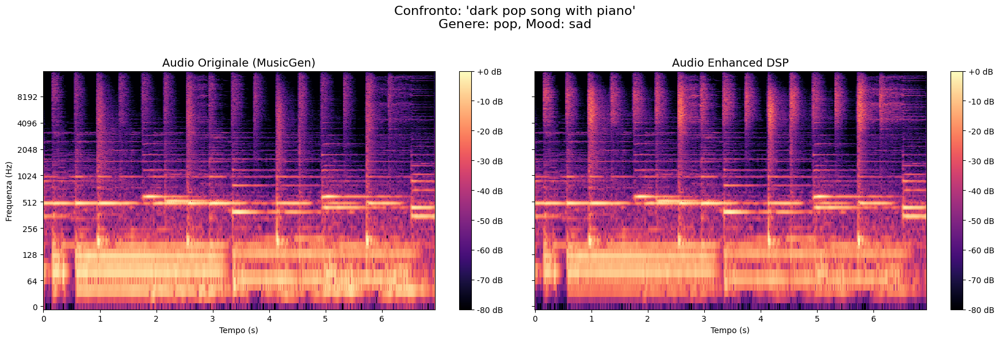

--------------------------------------------------

--- **Campione 2/2** ---
 Prompt: calm pop song with synth
 Genere: pop
 Mood: sad

📊 **Metriche Audio:**
   Originale: 222080 campioni, 32000 Hz, -23.8 LUFS
   Enhanced:  222080 campioni, 32000 Hz, -22.7 LUFS
   Differenza SNR: 4.1 dB

 **Ascolto:**
   Originale (MusicGen):


   Enhanced (DSP):


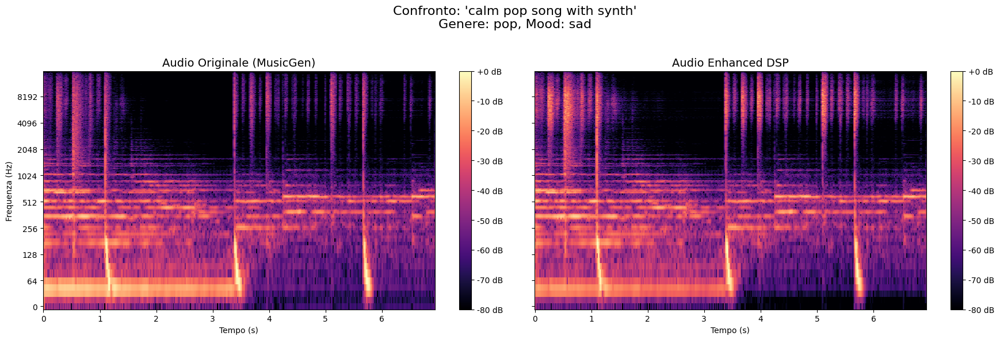

--------------------------------------------------


In [14]:
def main():
    print("\n 📊 ESECUZIONE VALUTAZIONE...")
    main_evaluation()

if __name__ == "__main__":
    main()

# **Valutazione enhancement DSP**

In [15]:
''' Calcola il centroide spettrale medio '''
def calculate_spectral_centroid(y, sr):
    spectral_centroids = librosa.feature.spectral_centroid(y=y, sr=sr)
    return float(np.mean(spectral_centroids))


''' Calcola la larghezza di banda spettrale media '''
def calculate_spectral_bandwidth(y, sr):
    spectral_bandwidth = librosa.feature.spectral_bandwidth(y=y, sr=sr)
    return float(np.mean(spectral_bandwidth))


''' Calcola la frequenza di rolloff spettrale media '''
def calculate_spectral_rolloff(y, sr, rolloff_percent=0.85):
    spectral_rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr, roll_percent=rolloff_percent)
    return float(np.mean(spectral_rolloff))


''' Calcola la convergenza spettrale tra originale e enhanced -> più il valore è basso, migliore è la convergenza '''
def calculate_spectral_convergence(original_spectrum, enhanced_spectrum):
    diff = np.abs(original_spectrum - enhanced_spectrum)
    return float(np.mean(diff / (np.abs(original_spectrum) + 1e-10)))


''' Calcola SNR tra segnale originale e processato '''
def calculate_snr_between_signals(original: np.ndarray, processed: np.ndarray) -> float:
    min_len = min(len(original), len(processed))
    original = original[:min_len]
    processed = processed[:min_len]

    noise = original - processed
    signal_power = np.mean(original ** 2)
    noise_power = np.mean(noise ** 2)

    if noise_power < 1e-12:
        return float('inf')
    elif signal_power < 1e-12:
        return float('-inf')

    return 10 * np.log10(signal_power / noise_power)


In [16]:
''' Analizza la qualità dell'audio '''
def analyze_audio_quality_with_metrics(filepath, original_audio=None):
    y, sr = librosa.load(filepath, sr=None)
    duration = librosa.get_duration(y=y, sr=sr)

    # Calcola il loudness (LUFS)
    meter = pyln.Meter(sr)
    loudness = meter.integrated_loudness(y)

    # Calcola SNR reale
    snr_real = None
    if original_audio is not None:
        snr_real = calculate_snr_between_signals(original_audio, y)

    # Calcolo dello spettro
    stft = np.abs(librosa.stft(y))
    freq_energy = np.mean(stft, axis=1)

    # Frequenza massima significativa
    freqs = librosa.fft_frequencies(sr=sr)
    energy_db = 10 * np.log10(freq_energy + 1e-10)
    max_energy = np.max(energy_db)
    threshold = max_energy - 40
    significant_freq_idx = np.where(energy_db > threshold)[0]
    max_significant_freq = freqs[significant_freq_idx[-1]] if len(significant_freq_idx) > 0 else 0

    # Metriche spettrali aggiuntive
    spectral_centroid = calculate_spectral_centroid(y, sr)
    spectral_bandwidth = calculate_spectral_bandwidth(y, sr)
    spectral_rolloff = calculate_spectral_rolloff(y, sr)

    # Calcola l'energia nelle bande di frequenza
    energy_low = np.mean(stft[(freqs >= 20) & (freqs < 200), :])
    energy_mid = np.mean(stft[(freqs >= 200) & (freqs < 2000), :])
    energy_high = np.mean(stft[(freqs >= 2000) & (freqs < 20000), :])
    total_energy = energy_low + energy_mid + energy_high

    result = {
        "filename": os.path.basename(filepath),
        "duration": float(duration),
        "loudness_lufs": float(loudness),
        "max_significant_frequency_hz": float(max_significant_freq),
        "sample_rate": int(sr),
        "spectral_centroid_hz": spectral_centroid,
        "spectral_bandwidth_hz": spectral_bandwidth,
        "spectral_rolloff_hz": spectral_rolloff,
        "energy_distribution": {
            "low_freq_energy": float(energy_low / total_energy),
            "mid_freq_energy": float(energy_mid / total_energy),
            "high_freq_energy": float(energy_high / total_energy)
        }
    }

    # Aggiungi SNR reale se disponibile
    if snr_real is not None:
        result["snr_real_db"] = float(snr_real) if snr_real not in [float('inf'), float('-inf')] else None

    return result

''' Funzione per analizzare tutto il dataset con metriche avanzate e SNR '''
def analyze_dataset_quality_advanced(metadata_path, original_dir, enhanced_dir):
    # Carica i metadati
    with open(metadata_path, 'r') as f:
        metadata = json.load(f)

    results = []

    print(" Analisi avanzata della qualità audio del dataset...")
    for item in tqdm(metadata, desc="Analisi file audio"):
        try:
            # Percorsi dei file
            original_path = os.path.join(original_dir, item['filename'])
            enhanced_path = os.path.join(enhanced_dir, item['filename'])

            # Carica l'audio originale per il calcolo dello SNR
            original_audio, sr_orig = librosa.load(original_path, sr=None, mono=True)

            # Analizza l'audio enhanced con riferimento all'originale
            analysis = analyze_audio_quality_with_metrics(enhanced_path, original_audio)

            # Aggiungi i metadati originali
            analysis.update({
                'prompt': item['prompt'],
                'genre': item['genre'],
                'mood': item['mood']
            })
            results.append(analysis)
        except Exception as e:
            print(f"❌ Errore nell'analisi di {item['filename']}: {str(e)}")
            continue

    return results

''' Funzione per calcolare statistiche aggregate con tutte le metriche '''
def calculate_comprehensive_stats(results):
    # Crea DataFrame dai risultati
    df = pd.DataFrame(results)

    stats = {
        "general_stats": {
            "num_samples": len(df),
            "mean_loudness_lufs": float(df['loudness_lufs'].mean()),
            "mean_snr_real_db": float(df['snr_real_db'].mean()) if 'snr_real_db' in df.columns else None,
            "mean_max_significant_frequency_hz": float(df['max_significant_frequency_hz'].mean()),
            "mean_spectral_centroid_hz": float(df['spectral_centroid_hz'].mean()),
            "mean_spectral_bandwidth_hz": float(df['spectral_bandwidth_hz'].mean()),
            "mean_spectral_rolloff_hz": float(df['spectral_rolloff_hz'].mean())
        },
        "loudness_by_genre": {},
        "snr_real_by_genre": {},
        "freq_by_genre": {},
        "spectral_centroid_by_genre": {},
        "spectral_bandwidth_by_genre": {},
        "energy_distribution_by_genre": {},
        "common_issues": {
            "low_loudness_count": int(len(df[df['loudness_lufs'] < -20])),
            "low_snr_count": int(len(df[df['snr_real_db'] < 5])) if 'snr_real_db' in df.columns else 0,
            "limited_freq_count": int(len(df[df['max_significant_frequency_hz'] < 10000])),
            "low_spectral_centroid_count": int(len(df[df['spectral_centroid_hz'] < 1000])),
            "narrow_bandwidth_count": int(len(df[df['spectral_bandwidth_hz'] < 2000]))
        }
    }

    # Popola le statistiche per genere
    for genre in df['genre'].unique():
        genre_data = df[df['genre'] == genre]
        stats["loudness_by_genre"][genre] = float(genre_data['loudness_lufs'].mean())
        if 'snr_real_db' in df.columns:
            stats["snr_real_by_genre"][genre] = float(genre_data['snr_real_db'].mean())
        stats["freq_by_genre"][genre] = float(genre_data['max_significant_frequency_hz'].mean())
        stats["spectral_centroid_by_genre"][genre] = float(genre_data['spectral_centroid_hz'].mean())
        stats["spectral_bandwidth_by_genre"][genre] = float(genre_data['spectral_bandwidth_hz'].mean())

        # Calcola la distribuzione energetica media per genere
        low_energy = genre_data['energy_distribution'].apply(lambda x: x['low_freq_energy']).mean()
        mid_energy = genre_data['energy_distribution'].apply(lambda x: x['mid_freq_energy']).mean()
        high_energy = genre_data['energy_distribution'].apply(lambda x: x['high_freq_energy']).mean()

        stats["energy_distribution_by_genre"][genre] = {
            "low_freq_percentage": float(low_energy * 100),
            "mid_freq_percentage": float(mid_energy * 100),
            "high_freq_percentage": float(high_energy * 100)
        }

    return stats

''' Funzione per visualizzare i risultati completi '''
def visualize_comprehensive_analysis(results, output_dir, stats_filename="enhanced_audio_quality_stats.json"):
    # Calcola le statistiche complete
    stats = calculate_comprehensive_stats(results)

    # Salva le statistiche nella cartella enhanced
    stats_path = os.path.join(output_dir, stats_filename)
    with open(stats_path, 'w') as f:
        json.dump(stats, f, indent=2)
    print(f"📊 Statistiche complete salvate in: {stats_path}")

    # Visualizza i risultati
    print("\n📊 METRICHE PRINCIPALI:")
    print(f"   Loudness medio: {stats['general_stats']['mean_loudness_lufs']:.1f} LUFS")
    if stats['general_stats']['mean_snr_real_db'] is not None:
        print(f"   SNR reale medio: {stats['general_stats']['mean_snr_real_db']:.1f} dB")
    print(f"   Frequenza massima media: {stats['general_stats']['mean_max_significant_frequency_hz']:.0f} Hz")

    print("\n📊 METRICHE SPETTRALI:")
    print(f"   Centroide spettrale medio: {stats['general_stats']['mean_spectral_centroid_hz']:.0f} Hz")
    print(f"   Bandwidth spettrale media: {stats['general_stats']['mean_spectral_bandwidth_hz']:.0f} Hz")
    print(f"   Rolloff spettrale medio: {stats['general_stats']['mean_spectral_rolloff_hz']:.0f} Hz")

    print("\n📊 DISTRIBUZIONE ENERGETICA PER GENERE:")
    for genre, energy in stats['energy_distribution_by_genre'].items():
        print(f"   {genre}: Bassi={energy['low_freq_percentage']:.1f}%, "
              f"Medi={energy['mid_freq_percentage']:.1f}%, "
              f"Alti={energy['high_freq_percentage']:.1f}%")

    # Problemi comuni
    print(f"\n📊 Problemi comuni riscontrati:")
    print(f"   - Loudness troppo basso: {stats['common_issues']['low_loudness_count']} file")
    print(f"   - SNR basso (< 5 dB): {stats['common_issues']['low_snr_count']} file")
    print(f"   - Frequenze limitate (< 10 kHz): {stats['common_issues']['limited_freq_count']} file")

    return stats


print("\n" + "="*60)
print("ANALISI COMPLETA DELLA QUALITÀ AUDIO ENHANCED CON DSP")
print("="*60)

ORIGINAL_DIR = "musicgen_dataset"
ENHANCED_DIR = "dsp_enhanced"

os.makedirs(ENHANCED_DIR, exist_ok=True)

metadata_path = os.path.join(ORIGINAL_DIR, "metadata.json")

# Analizza la qualità del dataset enhanced
quality_results = analyze_dataset_quality_advanced(metadata_path, ORIGINAL_DIR, ENHANCED_DIR)

# Calcola e visualizza statistiche complete
comprehensive_stats = visualize_comprehensive_analysis(quality_results, ENHANCED_DIR)

# Salva i risultati dettagliati nella cartella enhanced
detailed_report_path = os.path.join(ENHANCED_DIR, 'detailed_enhanced_analysis_report.json')
with open(detailed_report_path, 'w') as f:
    json.dump(quality_results, f, indent=2)

print(f"\n✅ Analisi completa degli audio enhanced")
print(f" Statistiche aggregate: {os.path.join(ENHANCED_DIR, 'enhanced_audio_quality_stats.json')}")
print(f" Dettagli completi: {detailed_report_path}")

# Mostra confronto con baseline se esiste
baseline_stats_path = os.path.join(ORIGINAL_DIR, 'musicgen_quality_stats.json')
if os.path.exists(baseline_stats_path):
    print(f"\n📈 Risultati confrontabili con quelli baseline: {baseline_stats_path}")


ANALISI COMPLETA DELLA QUALITÀ AUDIO ENHANCED CON DSP
 Analisi avanzata della qualità audio del dataset...


Analisi file audio: 100%|██████████| 15/15 [00:01<00:00, 12.69it/s]

📊 Statistiche complete salvate in: dsp_enhanced/enhanced_audio_quality_stats.json

📊 METRICHE PRINCIPALI:
   Loudness medio: -18.4 LUFS
   SNR reale medio: 6.9 dB
   Frequenza massima media: 15848 Hz

📊 METRICHE SPETTRALI:
   Centroide spettrale medio: 2876 Hz
   Bandwidth spettrale media: 2488 Hz
   Rolloff spettrale medio: 5017 Hz

📊 DISTRIBUZIONE ENERGETICA PER GENERE:
   pop: Bassi=80.7%, Medi=13.2%, Alti=6.1%
   rock: Bassi=56.1%, Medi=32.1%, Alti=11.8%
   lofi: Bassi=82.1%, Medi=14.5%, Alti=3.4%
   electronic: Bassi=82.8%, Medi=16.4%, Alti=0.8%
   hip-hop: Bassi=85.6%, Medi=6.8%, Alti=7.6%

📊 Problemi comuni riscontrati:
   - Loudness troppo basso: 4 file
   - SNR basso (< 5 dB): 6 file
   - Frequenze limitate (< 10 kHz): 0 file

✅ Analisi completa degli audio enhanced
 Statistiche aggregate: dsp_enhanced/enhanced_audio_quality_stats.json
 Dettagli completi: dsp_enhanced/detailed_enhanced_analysis_report.json

📈 Risultati confrontabili con quelli baseline: musicgen_dataset/musicg

# **DEMUCS+DSP**

In [17]:
''' Funzioni DSP di prima '''

''' Correzione avanzata del clipping con interpolazione cubica -> identifica i sample clippati e li ricostruisce '''
def declip_audio(y, threshold=0.95):
    # Trova gli indici dei sample che superano la soglia di clipping
    clipped_samples = np.where(np.abs(y) > threshold)[0]

    # Se non ci sono sample clippati, restituisce l'audio originale
    if len(clipped_samples) == 0:
        return y

    # Numero di sample clippati
    print(f"   Correzione di {len(clipped_samples)} sample clippati")

    # Crea una maschera booleana dove True = sample validi, False = sample clippati
    valid_mask = np.ones(len(y), dtype=bool) # Inizialmente considera tutti i valori validi
    valid_mask[clipped_samples] = False # Poi cambia il valore da True a False per tutti i valori clippati

    # Prepara gli assi per l'interpolazione
    x = np.arange(len(y))
    # Crea una curva CubicSpline che passi attraverso i sample validi (ignora i punti clippati)
    cs = CubicSpline(x[valid_mask], y[valid_mask])
    # Ora usa la curva per calcolare un valore per ogni singolo punto dell'audio (compresi quelli clippati)
    # generando un nuovo segnale in cui le parti clippate hanno un valore
    y_declipped = cs(x)

    # Sostituisci i sample interpolati con quelli originali dove erano già validi
    y_declipped[valid_mask] = y[valid_mask]

    return y_declipped


''' Estensione zero-shot della banda audio usando spectral grafting -> genera sinteticamente le alte frequenze mancanti '''
def bandwidth_extension(y, sr, target_bandwidth=16000):
    # Calcola la frequenza di Nyquist (metà del sample rate)
    # è la massima frequenza che può essere rappresentata digitalmente in un segnale
    nyquist = sr // 2

    # Se la banda target è minore o uguale a Nyquist, non serve estensione
    if target_bandwidth <= nyquist:
        return y

    print(f"   Estensione banda: {nyquist}Hz → {target_bandwidth}Hz")

    # Parametri per la STFT (Short-Time Fourier Transform) -> trasforma il segnale dal dominio del tempo al dominio della frequenza
    n_fft = 2048  # Dimensione della finestra FFT
    hop_length = n_fft // 4  # Overlap tra le finestre (75%)

    # Calcola la STFT per ottenere magnitudini e fasi
    S = librosa.stft(y, n_fft=n_fft, hop_length=hop_length)
    magnitudes = np.abs(S)
    phases = np.angle(S)

    # Calcola quanti bin FFT servono per coprire la tarfet bandwidth
    new_bins = int((target_bandwidth / nyquist) * (n_fft // 2 + 1))
    # Crea una nuova matrice per le magnitudini estese
    extended_magnitudes = np.zeros((new_bins, magnitudes.shape[1]), dtype=np.float32)

    # Copia le frequenze originali nella parte bassa del nuovo spettro
    extended_magnitudes[:magnitudes.shape[0], :] = magnitudes

    # Genera sinteticamente le alte frequenze mancanti
    for bin_idx in range(magnitudes.shape[0], new_bins):
        # Calcola un fattore di riduzione per l'ampiezza
        decay = np.exp(-2.0 * (bin_idx - magnitudes.shape[0]) / magnitudes.shape[0])

        # Trova una frequenza di riferimento più bassa nelle frequenze originali (scala logaritmica)
        ref_bin = int(magnitudes.shape[0] * 0.7 * (1 - np.log(1 + bin_idx - magnitudes.shape[0])))
        ref_bin = max(0, min(ref_bin, magnitudes.shape[0] - 1))

        # Calcola il valore della magnitudine del nuovo bin
        extended_magnitudes[bin_idx, :] = magnitudes[ref_bin, :] * decay

    # Ricostruisce lo spettro complesso con le nuove magnitudini e fasi originali
    S_extended = extended_magnitudes * np.exp(1j * phases)
    # Esegue la trasformata inversa per tornare al dominio del tempo
    y_extended = librosa.istft(S_extended, hop_length=hop_length, length=len(y))

    return y_extended


'''Equalizzazione adattiva basata sul contenuto spettrale del segnale '''
def adaptive_equalization(y, sr):
    try:
        # Calcola il centroide spettrale (centro di massa dello spettro)
        # < 1200 Hz indica un suono "scuro", > 2500 Hz indica un suono "brillante"
        spectral_centroid = np.mean(librosa.feature.spectral_centroid(y=y, sr=sr))

        # Calcola la planarità spettrale (quanto lo spettro è rumoroso vs tonale)
        # vicino a 1 indica energia distribuita in modo uniforme, vicino a 0 indica energia concentrata in poche frequenze
        spectral_flatness = np.mean(librosa.feature.spectral_flatness(y=y))

        print(f"   Analisi spettrale: centroid={spectral_centroid:.0f}Hz, flatness={spectral_flatness:.3f}")

        # Applica equalizzazione basata sul centroide spettrale
        if spectral_centroid < 1200:  # Assume suono scuro (basse frequenze dominanti)
            # Boost delle frequenze medio-alte (800-5000 Hz)
            b, a = signal.butter(4, [800/(sr/2), 5000/(sr/2)], btype='bandpass')
            y_boost = signal.filtfilt(b, a, y)
            y_eq = y + 0.25 * y_boost  # 75% originale + 25% frequenze boostate -> ne risulta un suono più chiaro

        elif spectral_centroid > 2500:  # Assume uono brillante (alte frequenze dominanti)
            # Leggera attenuazione delle alte frequenze (>6000 Hz)
            b, a = signal.butter(4, 6000/(sr/2), btype='lowpass')
            y_eq = signal.filtfilt(b, a, y)
            y_eq = 0.7 * y + 0.3 * y_eq  # 70% originale + 30% filtrato -> rende il suono meno aspro

        else:  # Se bilanciato non corregge
            y_eq = y

        return y_eq

    except Exception as e:
        print(f"   ⚠️ Equalizzazione saltata: {e}")
        return y


''' Limiter multibanda '''
def multiband_limiter(y, sr, thresholds=[-3.0, -2.0, -1.0], ratios=[4, 6, 8]):
    try:
        # Tre bande di frequenza: bassi, medi, alti
        bands = [
            (50, 300),
            (300, 3000),
            (3000, 10000)
        ]

        # Inizializza l'audio limitato
        y_limited = np.zeros_like(y)

        # Processa ogni banda separatamente
        for i, (low_freq, high_freq) in enumerate(bands):
            # Controlla se la banda è entro il range di Nyquist
            if high_freq < sr//2:
                # Crea un filtro passa-banda per la banda corrente -> isola la banda di frequenze dell'audio originale
                b, a = signal.butter(4, [low_freq/(sr/2), high_freq/(sr/2)], btype='band')
                # Applica il filtro per estrarre la banda
                band_signal = signal.filtfilt(b, a, y)

                # Conversione della threshold da dB a valore lineare
                threshold = 10**(thresholds[i]/20.0)
                # Calcola l'inviluppo del segnale
                envelope = np.abs(band_signal)

                # Inizializza il gain reduction (1 = nessuna riduzione)
                gain_reduction = np.ones_like(envelope)
                # Trova i sample sopra la threshold
                over_threshold = envelope > threshold
                # Applica compressione solo ai sample sopra la soglia
                gain_reduction[over_threshold] = 1 / (1 + (envelope[over_threshold]/threshold - 1) * (1 - 1/ratios[i]))

                # Applica il gain reduction alla banda
                band_limited = band_signal * gain_reduction
                # Aggiunge la banda processata al mix finale
                y_limited += band_limited

        # Somma delle 3 bande processate per ottenere l'audio completo
        y_final = 0.6 * y_limited + 0.4 * y

        return y_final

    except Exception as e:
        print(f"   ⚠️ Limiter multibanda saltato: {e}")
        return y


''' Normalizzazione LUFS '''
def rms_normalize_lufs(y, target_lufs=-14.0, sr=44100):
    try:
        # Crea un misuratore LUFS calibrato per il sample rate
        meter = pyln.Meter(sr)
        # Calcola la loudness integrata (LUFS)
        loudness = meter.integrated_loudness(y)
        # Applica la normalizzazione al target LUFS
        return pyln.normalize.loudness(y, loudness, target_lufs)
    except Exception as e:
        print(f"   ⚠️ Normalizzazione LUFS saltata: {e}")
        return y


''' Aggiunge brillantezza e nitidezza aumentando il volume delle alte frequenze '''
def audio_exciter(y, sr, intensity=0.5):
    # Estrae solo le alte frequenze
    b, a = signal.butter(4, 4000/(sr/2), btype='high')
    highs = signal.filtfilt(b, a, y)

    # Applica leggera distorsione armonica (aggiunge overtone)
    highs_distorted = np.tanh(highs * 2.0) * 0.5

    # Mix con il segnale originale
    y_enhanced = y + (highs_distorted * intensity)

    # Normalizza per prevenire clipping
    peak = np.max(np.abs(y_enhanced))
    if peak > 0.99:
        y_enhanced = y_enhanced * 0.99 / peak

    return y_enhanced


''' Boost delle alte frequenze con filtro shelving '''
def boost_high_frequencies(y, sr, gain_db=6.0, cutoff_freq=5000):
    # Crea un filtro shelving per le alte frequenze
    b, a = signal.butter(2, cutoff_freq/(sr/2), btype='high')

    # Applica il filtro
    y_high = signal.filtfilt(b, a, y)

    # Aggiunge il segnale filtrato con guadagno
    gain_linear = 10**(gain_db/20.0)
    y_boosted = y + (y_high * (gain_linear - 1))

    # Previene il clipping
    y_boosted = np.clip(y_boosted, -0.99, 0.99)
    return y_boosted

In [18]:
''' Funzione per processare le sorgenti '''
def stem_enhancements_complete(stem_audio, sr, stem_type='other'):
    try:
        # 1. De-clipping avanzato
        y_processed = declip_audio(stem_audio, threshold=0.98)

        # 2. Bandwidth extension per recuperare frequenze
        y_processed = bandwidth_extension(y_processed, sr, target_bandwidth=16000)

        # 3. Processing specifico
        if stem_type == 'drums':
            # Per la batteria, focus sulla brillantezza e controllo dei bassi
            y_processed = audio_exciter(y_processed, sr, intensity=0.4)
            # Filtro butterworth per rimuovere frequenze troppo basse
            b, a = butter(2, 40, btype='high', fs=sr)
            y_processed = filtfilt(b, a, y_processed)

        elif stem_type == 'bass':
            # Per il basso, compattezza e pulizia
            # Filtro butterworth per rimuovere frequenze troppo basse
            b, a = butter(2, 60, btype='high', fs=sr)
            y_processed = filtfilt(b, a, y_processed)
            y_processed = adaptive_equalization(y_processed, sr)

        elif stem_type == 'other':
            # Per gli altri strumenti, chiarezza generale
            y_processed = adaptive_equalization(y_processed, sr)

        # 4. Limiter multibanda per controllo dinamico
        y_processed = multiband_limiter(y_processed, sr)

        return y_processed

    except Exception as e:
        print(f"⚠️ Errore in stem_enhancements: {e}")
        return stem_audio


In [19]:
''' Pipeline di enhancement con DEMUCS + DSP '''
def demucs_enhancement_pipeline(input_path, output_path, item_metadata):
    try:
        print(f"\n  Processing: {os.path.basename(input_path)}")

        # 1) Caricamento e Preprocessing Audio
        try:
            wav, sr = torchaudio.load(input_path)
            if wav.dim() > 2: wav = wav.squeeze()
            if wav.dim() == 1: wav = wav.unsqueeze(0)
        except Exception:
            y, sr = librosa.load(input_path, sr=None, mono=False)
            wav = torch.FloatTensor(y) if y.ndim > 1 else torch.FloatTensor(y).unsqueeze(0)

        if wav.shape[0] == 1: wav = torch.cat([wav, wav], dim=0)
        if sr != 44100:
            wav = torchaudio.functional.resample(wav, sr, 44100)
            sr = 44100 # Aggiorna sr per il resto della pipeline
        if wav.abs().max() > 0:
            wav = wav / wav.abs().max()

        # 2) Separazione Stems con Demucs
        print("    1) Separazione sorgenti con Demucs")
        model = get_model('htdemucs')
        device = 'cuda' if torch.cuda.is_available() else 'cpu'
        model.to(device)
        sources = apply_model(model, wav.unsqueeze(0).to(device), device=device, split=True, overlap=0.5)[0]

        stems = {
            'drums': sources[model.sources.index('drums')].mean(dim=0).cpu().numpy(),
            'bass': sources[model.sources.index('bass')].mean(dim=0).cpu().numpy(),
            'other': sources[model.sources.index('other')].mean(dim=0).cpu().numpy()
        }

        # 3) Post-processing mirato per ogni sorgente
        print("    2) Processing DSP mirato per ogni sorgente")
        stems_enhanced = {
            'drums': stem_enhancements_complete(stems['drums'], sr, 'drums'),
            'bass': stem_enhancements_complete(stems['bass'], sr, 'bass'),
            'other': stem_enhancements_complete(stems['other'], sr, 'other')
        }

        # 4) Remix pesato
        print("    3) Remix pesato")
        # Calcola pesi basati sull'energia, per preservare il mix originale
        energy = {k: np.mean(np.abs(v)) for k, v in stems_enhanced.items()}
        total_energy = sum(energy.values()) + 1e-8
        energy_weights = {k: v / total_energy for k, v in energy.items()}

        # Bilancia con pesi fissi
        balanced_weights = {'drums': 0.33, 'bass': 0.33, 'other': 0.34}
        alpha = 0.6 # 60% dal mix originale, 40% dal bilanciamento fisso
        final_weights = {k: alpha * energy_weights[k] + (1 - alpha) * balanced_weights[k] for k in stems.keys()}

        # Normalizza i pesi per assicurare che la somma sia 1
        weight_sum = sum(final_weights.values())
        final_weights = {k: v / weight_sum for k, v in final_weights.items()}
        print(f"       Pesi finali - D: {final_weights['drums']:.2f}, B: {final_weights['bass']:.2f}, O: {final_weights['other']:.2f}")

        # Mixing finale
        final_mix = sum(stems_enhanced[k] * final_weights[k] for k in stems.keys())

        # 5) Mastering finale
        print("    4) Mastering finale sul mix")
        # Riduzione del rumore residuo
        y_mastered = nr.reduce_noise(y=final_mix, sr=sr, stationary=False, prop_decrease=0.3)
        # Filtro passa-alto per rimuovere DC offset e rumble
        b, a = butter(2, 30, btype='high', fs=sr)
        y_mastered = filtfilt(b, a, y_mastered)
        # Limiter di sicurezza
        peak = np.max(np.abs(y_mastered))
        if peak > 0.99:
            y_mastered = y_mastered * 0.99 / peak
        # Normalizzazione LUFS
        y_final = rms_normalize_lufs(y_mastered, sr=sr, target_lufs=-14.0)

        # 6) Salvataggi
        sf.write(output_path, y_final, sr)
        print(f"    ✅ Salvataggio completato: {os.path.basename(output_path)}")
        return True

    except Exception as e:
        print(f"❌ Errore durante il processing di {os.path.basename(input_path)}: {e}")
        return False

In [20]:
def main():
    print("=" * 60)
    print("PIPELINE DI ENHANCEMENT DEMUCS + DSP")
    print("=" * 60)

    ORIGINAL_DIR = "musicgen_dataset"
    ENHANCED_DIR = Path("demucs_mastered_audio")
    ENHANCED_DIR.mkdir(exist_ok=True)

    metadata_file = os.path.join(ORIGINAL_DIR, "metadata.json")
    if not os.path.exists(metadata_file):
        print(f"❌ File metadati '{metadata_file}' non trovato!")
        return

    with open(metadata_file, 'r') as f:
        metadata = json.load(f)
    file_metadata_map = {item['filename']: item for item in metadata}

    files_to_process = list(Path(ORIGINAL_DIR).glob("*.wav"))
    if not files_to_process:
        print(f"❌ Nessun file .wav trovato in '{ORIGINAL_DIR}'!")
        return

    print(f"📁 Trovati {len(files_to_process)} file da processare.")

    success_count = 0
    for file_path in tqdm(files_to_process, desc="Enhancing audio"):
        item_metadata = file_metadata_map.get(file_path.name, {})
        output_path = ENHANCED_DIR / file_path.name

        if demucs_enhancement_pipeline(str(file_path), str(output_path), item_metadata):
            success_count += 1

    print("\n" + "=" * 60)
    print("PIPELINE COMPLETATA")
    print(f"✅ Processati con successo: {success_count}/{len(files_to_process)} file.")
    print(f"📁 File originali: {ORIGINAL_DIR}/")
    print(f"    File ottimizzati: {ENHANCED_DIR}/")


if __name__ == "__main__":
    main()

PIPELINE DI ENHANCEMENT DEMUCS + DSP
📁 Trovati 15 file da processare.


Enhancing audio:   0%|          | 0/15 [00:00<?, ?it/s]


  Processing: audio_008_lofi.wav
    1) Separazione sorgenti con Demucs
Downloading: "https://dl.fbaipublicfiles.com/demucs/hybrid_transformer/955717e8-8726e21a.th" to /root/.cache/torch/hub/checkpoints/955717e8-8726e21a.th



  0%|          | 0.00/80.2M [00:00<?, ?B/s]
  2%|▏         | 1.62M/80.2M [00:00<00:04, 16.9MB/s]
 10%|▉         | 7.75M/80.2M [00:00<00:01, 44.4MB/s]
 29%|██▉       | 23.4M/80.2M [00:00<00:00, 98.6MB/s]
 53%|█████▎    | 42.6M/80.2M [00:00<00:00, 139MB/s] 
 75%|███████▍  | 60.1M/80.2M [00:00<00:00, 155MB/s]
100%|██████████| 80.2M/80.2M [00:00<00:00, 130MB/s]


    2) Processing DSP mirato per ogni sorgente
   Analisi spettrale: centroid=314Hz, flatness=0.000
   Analisi spettrale: centroid=518Hz, flatness=0.000
    3) Remix pesato
       Pesi finali - D: 0.30, B: 0.26, O: 0.45


Enhancing audio:   7%|▋         | 1/15 [00:02<00:39,  2.81s/it]

    4) Mastering finale sul mix
    ✅ Salvataggio completato: audio_008_lofi.wav

  Processing: audio_013_hip-hop.wav
    1) Separazione sorgenti con Demucs
    2) Processing DSP mirato per ogni sorgente
   Correzione di 14 sample clippati
   Analisi spettrale: centroid=6586Hz, flatness=0.144
   Analisi spettrale: centroid=6800Hz, flatness=0.148


Enhancing audio:  13%|█▎        | 2/15 [00:04<00:28,  2.22s/it]

    3) Remix pesato
       Pesi finali - D: 0.73, B: 0.13, O: 0.14
    4) Mastering finale sul mix
    ✅ Salvataggio completato: audio_013_hip-hop.wav

  Processing: audio_011_electronic.wav
    1) Separazione sorgenti con Demucs
    2) Processing DSP mirato per ogni sorgente
   Analisi spettrale: centroid=4726Hz, flatness=0.029
   Correzione di 9 sample clippati


Enhancing audio:  20%|██        | 3/15 [00:05<00:21,  1.79s/it]

   Analisi spettrale: centroid=679Hz, flatness=0.000
    3) Remix pesato
       Pesi finali - D: 0.13, B: 0.13, O: 0.74
    4) Mastering finale sul mix
    ✅ Salvataggio completato: audio_011_electronic.wav

  Processing: audio_012_hip-hop.wav
    1) Separazione sorgenti con Demucs
    2) Processing DSP mirato per ogni sorgente
   Analisi spettrale: centroid=475Hz, flatness=0.000
   Analisi spettrale: centroid=1388Hz, flatness=0.000
    3) Remix pesato
       Pesi finali - D: 0.47, B: 0.27, O: 0.26
    4) Mastering finale sul mix


Enhancing audio:  27%|██▋       | 4/15 [00:07<00:17,  1.58s/it]

    ✅ Salvataggio completato: audio_012_hip-hop.wav

  Processing: audio_010_electronic.wav
    1) Separazione sorgenti con Demucs
    2) Processing DSP mirato per ogni sorgente
   Analisi spettrale: centroid=484Hz, flatness=0.000
   Analisi spettrale: centroid=5605Hz, flatness=0.043


Enhancing audio:  33%|███▎      | 5/15 [00:08<00:14,  1.47s/it]

    3) Remix pesato
       Pesi finali - D: 0.66, B: 0.20, O: 0.14
    4) Mastering finale sul mix
    ✅ Salvataggio completato: audio_010_electronic.wav

  Processing: audio_002_pop.wav
    1) Separazione sorgenti con Demucs
    2) Processing DSP mirato per ogni sorgente
   Analisi spettrale: centroid=349Hz, flatness=0.001
   Analisi spettrale: centroid=986Hz, flatness=0.000
    3) Remix pesato
       Pesi finali - D: 0.17, B: 0.36, O: 0.47


Enhancing audio:  40%|████      | 6/15 [00:09<00:12,  1.39s/it]

    4) Mastering finale sul mix
    ✅ Salvataggio completato: audio_002_pop.wav

  Processing: audio_006_lofi.wav
    1) Separazione sorgenti con Demucs
    2) Processing DSP mirato per ogni sorgente
   Correzione di 57 sample clippati
   Analisi spettrale: centroid=5222Hz, flatness=0.041
   Analisi spettrale: centroid=631Hz, flatness=0.000
    3) Remix pesato
       Pesi finali - D: 0.47, B: 0.13, O: 0.40
    4) Mastering finale sul mix


Enhancing audio:  47%|████▋     | 7/15 [00:11<00:11,  1.41s/it]

    ✅ Salvataggio completato: audio_006_lofi.wav

  Processing: audio_001_pop.wav
    1) Separazione sorgenti con Demucs
    2) Processing DSP mirato per ogni sorgente
   Correzione di 2 sample clippati
   Analisi spettrale: centroid=3215Hz, flatness=0.042


Enhancing audio:  53%|█████▎    | 8/15 [00:12<00:10,  1.47s/it]

   Analisi spettrale: centroid=809Hz, flatness=0.000
    3) Remix pesato
       Pesi finali - D: 0.30, B: 0.18, O: 0.52
    4) Mastering finale sul mix
    ✅ Salvataggio completato: audio_001_pop.wav

  Processing: audio_000_pop.wav
    1) Separazione sorgenti con Demucs
    2) Processing DSP mirato per ogni sorgente
   Correzione di 1 sample clippati
   Analisi spettrale: centroid=301Hz, flatness=0.000
   Analisi spettrale: centroid=2443Hz, flatness=0.002


Enhancing audio:  60%|██████    | 9/15 [00:13<00:08,  1.40s/it]

    3) Remix pesato
       Pesi finali - D: 0.43, B: 0.40, O: 0.17
    4) Mastering finale sul mix
    ✅ Salvataggio completato: audio_000_pop.wav

  Processing: audio_014_hip-hop.wav
    1) Separazione sorgenti con Demucs
    2) Processing DSP mirato per ogni sorgente
   Correzione di 1 sample clippati
   Analisi spettrale: centroid=4227Hz, flatness=0.086
   Analisi spettrale: centroid=5970Hz, flatness=0.110


Enhancing audio:  67%|██████▋   | 10/15 [00:15<00:06,  1.36s/it]

    3) Remix pesato
       Pesi finali - D: 0.64, B: 0.22, O: 0.14
    4) Mastering finale sul mix
    ✅ Salvataggio completato: audio_014_hip-hop.wav

  Processing: audio_009_electronic.wav
    1) Separazione sorgenti con Demucs
    2) Processing DSP mirato per ogni sorgente
   Analisi spettrale: centroid=1527Hz, flatness=0.001
   Analisi spettrale: centroid=628Hz, flatness=0.000
    3) Remix pesato
       Pesi finali - D: 0.21, B: 0.21, O: 0.58
    4) Mastering finale sul mix


Enhancing audio:  73%|███████▎  | 11/15 [00:16<00:05,  1.33s/it]

    ✅ Salvataggio completato: audio_009_electronic.wav

  Processing: audio_004_rock.wav
    1) Separazione sorgenti con Demucs
    2) Processing DSP mirato per ogni sorgente
   Analisi spettrale: centroid=471Hz, flatness=0.000
   Analisi spettrale: centroid=1751Hz, flatness=0.001


Enhancing audio:  80%|████████  | 12/15 [00:17<00:03,  1.31s/it]

    3) Remix pesato
       Pesi finali - D: 0.18, B: 0.55, O: 0.27
    4) Mastering finale sul mix
    ✅ Salvataggio completato: audio_004_rock.wav

  Processing: audio_005_rock.wav
    1) Separazione sorgenti con Demucs
    2) Processing DSP mirato per ogni sorgente
   Analisi spettrale: centroid=5879Hz, flatness=0.083
   Analisi spettrale: centroid=2768Hz, flatness=0.000
    3) Remix pesato
       Pesi finali - D: 0.16, B: 0.13, O: 0.71
    4) Mastering finale sul mix


Enhancing audio:  87%|████████▋ | 13/15 [00:18<00:02,  1.29s/it]

    ✅ Salvataggio completato: audio_005_rock.wav

  Processing: audio_007_lofi.wav
    1) Separazione sorgenti con Demucs
    2) Processing DSP mirato per ogni sorgente
   Correzione di 38 sample clippati
   Analisi spettrale: centroid=5669Hz, flatness=0.075


Enhancing audio:  93%|█████████▎| 14/15 [00:20<00:01,  1.29s/it]

   Analisi spettrale: centroid=3111Hz, flatness=0.024
    3) Remix pesato
       Pesi finali - D: 0.69, B: 0.13, O: 0.18
    4) Mastering finale sul mix
    ✅ Salvataggio completato: audio_007_lofi.wav

  Processing: audio_003_rock.wav
    1) Separazione sorgenti con Demucs
    2) Processing DSP mirato per ogni sorgente
   Analisi spettrale: centroid=4542Hz, flatness=0.048
   Analisi spettrale: centroid=1412Hz, flatness=0.000
    3) Remix pesato
       Pesi finali - D: 0.18, B: 0.13, O: 0.68
    4) Mastering finale sul mix


Enhancing audio: 100%|██████████| 15/15 [00:21<00:00,  1.44s/it]

    ✅ Salvataggio completato: audio_003_rock.wav

PIPELINE COMPLETATA
✅ Processati con successo: 15/15 file.
📁 File originali: musicgen_dataset/
    File ottimizzati: demucs_mastered_audio/



 📊 ESECUZIONE VALUTAZIONE...
 **VALUTAZIONE DEMUCS + DSP ENHANCEMENT** 

--- **Campione 1/2** ---
 Prompt: calm pop song with synth
 Genere: pop
 Mood: sad

📊 **Metriche Audio:**
   Originale: 222080 campioni, 32000 Hz, -23.8 LUFS
   Enhanced:  306054 campioni, 44100 Hz, -14.1 LUFS
   Differenza SNR: -9.8 dB

 **Ascolto:**
   Originale (MusicGen):


   Enhanced (Demucs + DSP):


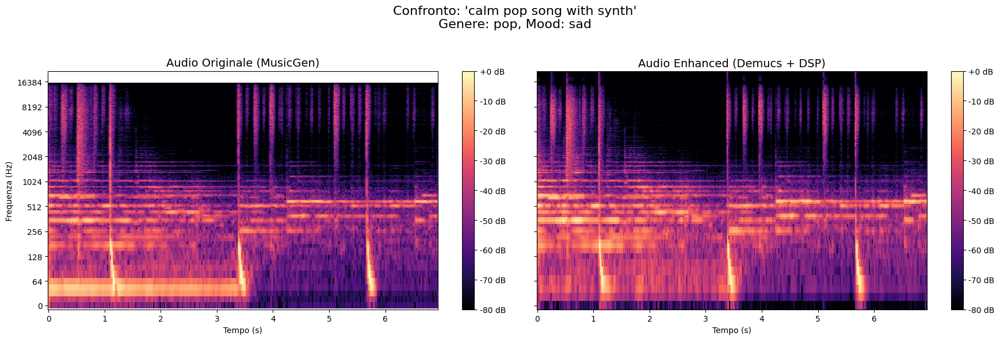

--------------------------------------------------

--- **Campione 2/2** ---
 Prompt: dark piano electronic music
 Genere: electronic
 Mood: sad

📊 **Metriche Audio:**
   Originale: 222080 campioni, 32000 Hz, -15.7 LUFS
   Enhanced:  306054 campioni, 44100 Hz, -14.0 LUFS
   Differenza SNR: -4.3 dB

 **Ascolto:**
   Originale (MusicGen):


   Enhanced (Demucs + DSP):


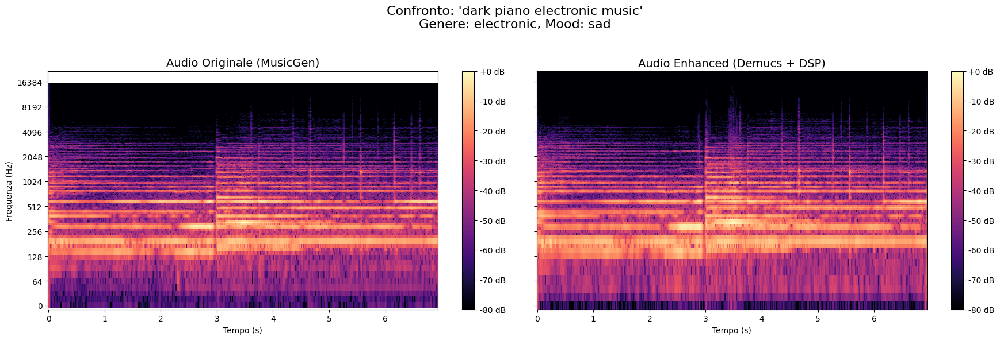

--------------------------------------------------


In [21]:
''' Calcola il volume LUFS di un file audio '''
def calculate_lufs(file_path: str, sr: int) -> float:
    try:
        y, _ = librosa.load(file_path, sr=sr, mono=True)
        meter = pyln.Meter(sr)
        return meter.integrated_loudness(y)
    except Exception as e:
        print(f"Errore nel calcolo LUFS per {file_path}: {e}")
        return None

''' Genera e mostra due spettrogrammi affiancati per il confronto '''
def plot_side_by_side_spectrograms(y_orig: np.ndarray, sr_orig: int, y_proc: np.ndarray, sr_proc: int, title: str):
    # Calcola la STFT (Short-Time Fourier Transform) e converte in dB
    S_orig = librosa.amplitude_to_db(np.abs(librosa.stft(y_orig)), ref=np.max)
    S_proc = librosa.amplitude_to_db(np.abs(librosa.stft(y_proc)), ref=np.max)

    fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=True)

    # Spettrogramma Originale
    img_orig = librosa.display.specshow(S_orig, sr=sr_orig, x_axis='time', y_axis='log', ax=axes[0])
    axes[0].set_title('Audio Originale (MusicGen)', fontsize=14)
    axes[0].set_xlabel('Tempo (s)')
    axes[0].set_ylabel('Frequenza (Hz)')
    fig.colorbar(img_orig, ax=axes[0], format="%+2.0f dB")

    # Spettrogramma Processato
    img_proc = librosa.display.specshow(S_proc, sr=sr_proc, x_axis='time', y_axis='log', ax=axes[1])
    axes[1].set_title('Audio Enhanced (Demucs + DSP)', fontsize=14)
    axes[1].set_xlabel('Tempo (s)')
    axes[1].set_ylabel('')
    fig.colorbar(img_proc, ax=axes[1], format="%+2.0f dB")

    fig.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

''' Calcola SNR tra segnale originale e processato '''
def calculate_snr_between_signals(original: np.ndarray, processed: np.ndarray) -> float:
    min_len = min(len(original), len(processed))
    original = original[:min_len]
    processed = processed[:min_len]

    noise = original - processed
    signal_power = np.mean(original ** 2)
    noise_power = np.mean(noise ** 2)

    if noise_power < 1e-12:
        return float('inf')
    elif signal_power < 1e-12:
        return float('-inf')

    return 10 * np.log10(signal_power / noise_power)

''' Confronta audio originali e processati con metriche complete '''
def evaluate_enhancement_quality(original_dir: str, enhanced_dir: str, metadata_file: str, num_samples: int = 2):
    print(" **VALUTAZIONE DEMUCS + DSP ENHANCEMENT** ")
    print("=" * 60)

    try:
        with open(metadata_file, 'r') as f:
            metadata = json.load(f)
    except FileNotFoundError:
        print(f"❌ Errore: File metadati non trovato in {metadata_file}.")
        return

    # Seleziona campioni casuali
    selected_samples = np.random.choice(metadata, size=min(num_samples, len(metadata)), replace=False)

    for i, item in enumerate(selected_samples):
        filename = item['filename']
        prompt = item['prompt']
        genre = item.get('genre', 'N/A')
        mood = item.get('mood', 'N/A')

        original_path = os.path.join(original_dir, filename)
        enhanced_path = os.path.join(enhanced_dir, filename)

        if not os.path.exists(original_path) or not os.path.exists(enhanced_path):
            print(f"File non trovato per {filename}. Saltato.")
            continue

        print(f"\n--- **Campione {i+1}/{num_samples}** ---")
        print(f" Prompt: {prompt}")
        print(f" Genere: {genre}")
        print(f" Mood: {mood}")

        # Caricamento audio
        y_orig, sr_orig = librosa.load(original_path, sr=None, mono=True)
        y_enh, sr_enh = librosa.load(enhanced_path, sr=None, mono=True)

        # Calcola metriche
        lufs_orig = calculate_lufs(original_path, sr_orig)
        lufs_enh = calculate_lufs(enhanced_path, sr_enh)
        snr_db = calculate_snr_between_signals(y_orig, y_enh)

        # Stampa risultati
        print(f"\n📊 **Metriche Audio:**")
        print(f"   Originale: {len(y_orig)} campioni, {sr_orig} Hz, {lufs_orig:.1f} LUFS")
        print(f"   Enhanced:  {len(y_enh)} campioni, {sr_enh} Hz, {lufs_enh:.1f} LUFS")
        print(f"   Differenza SNR: {snr_db:.1f} dB")

        # Riproduzione audio
        print(f"\n **Ascolto:**")
        print("   Originale (MusicGen):")
        display(Audio(y_orig, rate=sr_orig))
        print("   Enhanced (Demucs + DSP):")
        display(Audio(y_enh, rate=sr_enh))

        # Spettrogrammi comparativi
        plot_side_by_side_spectrograms(
            y_orig, sr_orig,
            y_enh, sr_enh,
            f"Confronto: '{prompt}'\nGenere: {genre}, Mood: {mood}"
        )

        print("-" * 50)

''' Funzione principale per eseguire la valutazione '''
def main_evaluation():
    ORIGINAL_FOLDER = "musicgen_dataset"
    ENHANCED_FOLDER = "demucs_mastered_audio"  # Modificato per matchare la tua cartella
    METADATA_FILE = os.path.join(ORIGINAL_FOLDER, "metadata.json")

    # Verifica esistenza cartelle
    if not os.path.exists(ORIGINAL_FOLDER):
        print(f"❌ Cartella originale non trovata: {ORIGINAL_FOLDER}")
        return

    if not os.path.exists(ENHANCED_FOLDER):
        print(f"❌ Cartella enhanced non trovata: {ENHANCED_FOLDER}")
        print("Esegui prima la pipeline di enhancement!")
        return

    # Esegui valutazione
    evaluate_enhancement_quality(ORIGINAL_FOLDER, ENHANCED_FOLDER, METADATA_FILE, num_samples=2)


def main():
    print("\n 📊 ESECUZIONE VALUTAZIONE...")
    main_evaluation()

if __name__ == "__main__":
    main()

# **Valutazione enhancement DEMUCS + DSP**

In [22]:
''' Calcola il centroide spettrale medio '''
def calculate_spectral_centroid(y, sr):
    spectral_centroids = librosa.feature.spectral_centroid(y=y, sr=sr)
    return float(np.mean(spectral_centroids))

''' Calcola la larghezza di banda spettrale media '''
def calculate_spectral_bandwidth(y, sr):
    spectral_bandwidth = librosa.feature.spectral_bandwidth(y=y, sr=sr)
    return float(np.mean(spectral_bandwidth))

''' Calcola la frequenza di rolloff spettrale media '''
def calculate_spectral_rolloff(y, sr, rolloff_percent=0.85):
    spectral_rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr, roll_percent=rolloff_percent)
    return float(np.mean(spectral_rolloff))

''' Calcola SNR tra segnale originale e processato '''
def calculate_snr_between_signals(original: np.ndarray, processed: np.ndarray) -> float:
    min_len = min(len(original), len(processed))
    original = original[:min_len]
    processed = processed[:min_len]

    noise = original - processed
    signal_power = np.mean(original ** 2)
    noise_power = np.mean(noise ** 2)

    if noise_power < 1e-12:
        return float('inf')
    elif signal_power < 1e-12:
        return float('-inf')

    return 10 * np.log10(signal_power / noise_power)

In [23]:
''' Analizza la qualità dell'audio '''
def analyze_audio_quality_with_metrics(filepath, original_audio=None):
    y, sr = librosa.load(filepath, sr=None)
    duration = librosa.get_duration(y=y, sr=sr)

    # Calcola il loudness (LUFS)
    meter = pyln.Meter(sr)
    loudness = meter.integrated_loudness(y)

    # Calcola SNR reale
    snr_real = None
    if original_audio is not None:
        snr_real = calculate_snr_between_signals(original_audio, y)

    # Calcolo dello spettro
    stft = np.abs(librosa.stft(y))
    freq_energy = np.mean(stft, axis=1)

    # Frequenza massima significativa
    freqs = librosa.fft_frequencies(sr=sr)
    energy_db = 10 * np.log10(freq_energy + 1e-10)
    max_energy = np.max(energy_db)
    threshold = max_energy - 40
    significant_freq_idx = np.where(energy_db > threshold)[0]
    max_significant_freq = freqs[significant_freq_idx[-1]] if len(significant_freq_idx) > 0 else 0

    # Metriche spettrali aggiuntive
    spectral_centroid = calculate_spectral_centroid(y, sr)
    spectral_bandwidth = calculate_spectral_bandwidth(y, sr)
    spectral_rolloff = calculate_spectral_rolloff(y, sr)

    # Calcola l'energia nelle bande di frequenza
    energy_low = np.mean(stft[(freqs >= 20) & (freqs < 200), :])
    energy_mid = np.mean(stft[(freqs >= 200) & (freqs < 2000), :])
    energy_high = np.mean(stft[(freqs >= 2000) & (freqs < 20000), :])
    total_energy = energy_low + energy_mid + energy_high

    result = {
        "filename": os.path.basename(filepath),
        "duration": float(duration),
        "loudness_lufs": float(loudness),
        "max_significant_frequency_hz": float(max_significant_freq),
        "sample_rate": int(sr),
        "spectral_centroid_hz": spectral_centroid,
        "spectral_bandwidth_hz": spectral_bandwidth,
        "spectral_rolloff_hz": spectral_rolloff,
        "energy_distribution": {
            "low_freq_energy": float(energy_low / total_energy),
            "mid_freq_energy": float(energy_mid / total_energy),
            "high_freq_energy": float(energy_high / total_energy)
        }
    }

    # Aggiungi SNR reale se disponibile
    if snr_real is not None:
        result["snr_real_db"] = float(snr_real) if snr_real not in [float('inf'), float('-inf')] else None

    return result

''' Funzione per analizzare tutto il dataset con metriche avanzate e SNR '''
def analyze_dataset_quality_advanced(metadata_path, original_dir, enhanced_dir):
    # Carica i metadati
    with open(metadata_path, 'r') as f:
        metadata = json.load(f)

    results = []

    print(" Analisi avanzata della qualità audio del dataset...")
    for item in tqdm(metadata, desc="Analisi file audio"):
        try:
            # Percorsi dei file
            original_path = os.path.join(original_dir, item['filename'])
            enhanced_path = os.path.join(enhanced_dir, item['filename'])

            # Carica l'audio originale per il calcolo dello SNR
            original_audio, sr_orig = librosa.load(original_path, sr=None, mono=True)

            # Analizza l'audio enhanced con riferimento all'originale
            analysis = analyze_audio_quality_with_metrics(enhanced_path, original_audio)

            # Aggiungi i metadati originali
            analysis.update({
                'prompt': item['prompt'],
                'genre': item['genre'],
                'mood': item['mood']
            })
            results.append(analysis)
        except Exception as e:
            print(f"❌ Errore nell'analisi di {item['filename']}: {str(e)}")
            continue

    return results

''' Funzione per calcolare statistiche aggregate con tutte le metriche '''
def calculate_comprehensive_stats(results):
    # Crea DataFrame dai risultati
    df = pd.DataFrame(results)

    stats = {
        "general_stats": {
            "num_samples": len(df),
            "mean_loudness_lufs": float(df['loudness_lufs'].mean()),
            "mean_snr_real_db": float(df['snr_real_db'].mean()) if 'snr_real_db' in df.columns else None,
            "mean_max_significant_frequency_hz": float(df['max_significant_frequency_hz'].mean()),
            "mean_spectral_centroid_hz": float(df['spectral_centroid_hz'].mean()),
            "mean_spectral_bandwidth_hz": float(df['spectral_bandwidth_hz'].mean()),
            "mean_spectral_rolloff_hz": float(df['spectral_rolloff_hz'].mean())
        },
        "loudness_by_genre": {},
        "snr_real_by_genre": {},
        "freq_by_genre": {},
        "spectral_centroid_by_genre": {},
        "spectral_bandwidth_by_genre": {},
        "energy_distribution_by_genre": {},
        "common_issues": {
            "low_loudness_count": int(len(df[df['loudness_lufs'] < -20])),
            "low_snr_count": int(len(df[df['snr_real_db'] < 5])) if 'snr_real_db' in df.columns else 0,
            "limited_freq_count": int(len(df[df['max_significant_frequency_hz'] < 10000])),
            "low_spectral_centroid_count": int(len(df[df['spectral_centroid_hz'] < 1000])),
            "narrow_bandwidth_count": int(len(df[df['spectral_bandwidth_hz'] < 2000]))
        }
    }

    # Popola le statistiche per genere
    for genre in df['genre'].unique():
        genre_data = df[df['genre'] == genre]
        stats["loudness_by_genre"][genre] = float(genre_data['loudness_lufs'].mean())
        if 'snr_real_db' in df.columns:
            stats["snr_real_by_genre"][genre] = float(genre_data['snr_real_db'].mean())
        stats["freq_by_genre"][genre] = float(genre_data['max_significant_frequency_hz'].mean())
        stats["spectral_centroid_by_genre"][genre] = float(genre_data['spectral_centroid_hz'].mean())
        stats["spectral_bandwidth_by_genre"][genre] = float(genre_data['spectral_bandwidth_hz'].mean())

        # Calcola la distribuzione energetica media per genere
        low_energy = genre_data['energy_distribution'].apply(lambda x: x['low_freq_energy']).mean()
        mid_energy = genre_data['energy_distribution'].apply(lambda x: x['mid_freq_energy']).mean()
        high_energy = genre_data['energy_distribution'].apply(lambda x: x['high_freq_energy']).mean()

        stats["energy_distribution_by_genre"][genre] = {
            "low_freq_percentage": float(low_energy * 100),
            "mid_freq_percentage": float(mid_energy * 100),
            "high_freq_percentage": float(high_energy * 100)
        }

    return stats

''' Funzione per visualizzare i risultati completi '''
def visualize_comprehensive_analysis(results, output_dir, stats_filename="demucs_enhanced_quality_stats.json"):
    # Calcola le statistiche complete
    stats = calculate_comprehensive_stats(results)

    # Salva le statistiche nella cartella enhanced
    stats_path = os.path.join(output_dir, stats_filename)
    with open(stats_path, 'w') as f:
        json.dump(stats, f, indent=2)
    print(f"📊 Statistiche complete salvate in: {stats_path}")

    # Visualizza i risultati
    print("\n📊 METRICHE PRINCIPALI:")
    print(f"   Loudness medio: {stats['general_stats']['mean_loudness_lufs']:.1f} LUFS")
    if stats['general_stats']['mean_snr_real_db'] is not None:
        print(f"   SNR reale medio: {stats['general_stats']['mean_snr_real_db']:.1f} dB")
    print(f"   Frequenza massima media: {stats['general_stats']['mean_max_significant_frequency_hz']:.0f} Hz")

    print("\n📊 METRICHE SPETTRALI:")
    print(f"   Centroide spettrale medio: {stats['general_stats']['mean_spectral_centroid_hz']:.0f} Hz")
    print(f"   Bandwidth spettrale media: {stats['general_stats']['mean_spectral_bandwidth_hz']:.0f} Hz")
    print(f"   Rolloff spettrale medio: {stats['general_stats']['mean_spectral_rolloff_hz']:.0f} Hz")

    print("\n📊 DISTRIBUZIONE ENERGETICA PER GENERE:")
    for genre, energy in stats['energy_distribution_by_genre'].items():
        print(f"   {genre}: Bassi={energy['low_freq_percentage']:.1f}%, "
              f"Medi={energy['mid_freq_percentage']:.1f}%, "
              f"Alti={energy['high_freq_percentage']:.1f}%")

    # Problemi comuni
    print(f"\n📊 Problemi comuni riscontrati:")
    print(f"   - Loudness troppo basso: {stats['common_issues']['low_loudness_count']} file")
    print(f"   - SNR basso (< 5 dB): {stats['common_issues']['low_snr_count']} file")
    print(f"   - Frequenze limitate (< 10 kHz): {stats['common_issues']['limited_freq_count']} file")

    return stats


def main_demucs_evaluation():
    print("\n" + "="*60)
    print("ANALISI COMPLETA DELLA QUALITÀ AUDIO ENHANCED CON DEMUCS + DSP")
    print("="*60)

    ORIGINAL_DIR = "musicgen_dataset"
    ENHANCED_DIR = "demucs_mastered_audio"  # Cartella dei tuoi file enhanced

    metadata_path = os.path.join(ORIGINAL_DIR, "metadata.json")

    # Analizza la qualità del dataset enhanced
    quality_results = analyze_dataset_quality_advanced(metadata_path, ORIGINAL_DIR, ENHANCED_DIR)

    # Calcola e visualizza statistiche complete
    comprehensive_stats = visualize_comprehensive_analysis(quality_results, ENHANCED_DIR)

    # Salva i risultati dettagliati
    detailed_report_path = os.path.join(ENHANCED_DIR, 'detailed_demucs_analysis_report.json')
    with open(detailed_report_path, 'w') as f:
        json.dump(quality_results, f, indent=2)

    print(f"\n✅ Analisi completa degli audio DEMUCS ENHANCED completata!")
    print(f"📊 Statistiche aggregate: {os.path.join(ENHANCED_DIR, 'demucs_enhanced_quality_stats.json')}")
    print(f"📄 Dettagli completi: {detailed_report_path}")

    # Mostra confronto con baseline se esiste
    baseline_stats_path = os.path.join(ORIGINAL_DIR, 'musicgen_quality_stats.json')
    if os.path.exists(baseline_stats_path):
        print(f"\n📈 Risultati confrontabili con baseline: {baseline_stats_path}")

if __name__ == "__main__":
    main_demucs_evaluation()


ANALISI COMPLETA DELLA QUALITÀ AUDIO ENHANCED CON DEMUCS + DSP
 Analisi avanzata della qualità audio del dataset...


Analisi file audio: 100%|██████████| 15/15 [00:01<00:00, 12.53it/s]

📊 Statistiche complete salvate in: demucs_mastered_audio/demucs_enhanced_quality_stats.json

📊 METRICHE PRINCIPALI:
   Loudness medio: -14.1 LUFS
   SNR reale medio: -3.7 dB
   Frequenza massima media: 19608 Hz

📊 METRICHE SPETTRALI:
   Centroide spettrale medio: 1963 Hz
   Bandwidth spettrale media: 2100 Hz
   Rolloff spettrale medio: 3499 Hz

📊 DISTRIBUZIONE ENERGETICA PER GENERE:
   pop: Bassi=78.9%, Medi=19.4%, Alti=1.7%
   rock: Bassi=61.8%, Medi=33.2%, Alti=5.0%
   lofi: Bassi=85.0%, Medi=14.0%, Alti=1.0%
   electronic: Bassi=84.0%, Medi=15.7%, Alti=0.3%
   hip-hop: Bassi=89.5%, Medi=7.3%, Alti=3.2%

📊 Problemi comuni riscontrati:
   - Loudness troppo basso: 0 file
   - SNR basso (< 5 dB): 15 file
   - Frequenze limitate (< 10 kHz): 0 file

✅ Analisi completa degli audio DEMUCS ENHANCED completata!
📊 Statistiche aggregate: demucs_mastered_audio/demucs_enhanced_quality_stats.json
📄 Dettagli completi: demucs_mastered_audio/detailed_demucs_analysis_report.json

📈 Risultati confronta

In [24]:
''' Funzione che analizza in modo avanzato l'SNR, dato il valore negativo ottenuto con l'enhancement Demus + DSP '''
def analyze_enhancement_quality(original_dir, enhanced_dir, num_samples=3):
    original_files = list(Path(original_dir).glob("*.wav"))
    selected_files = random.sample(original_files, min(num_samples, len(original_files)))

    results = []

    # Per ogni file originale, costruisce il percorso al corrispondente file enhanced
    for orig_file in selected_files:
        enh_file = Path(enhanced_dir) / orig_file.name

        if not enh_file.exists():
            continue

        # Carica gli audio e allinea la lunghezza
        y_orig, sr_orig = librosa.load(orig_file, sr=None)
        y_enh, sr_enh = librosa.load(enh_file, sr=None)

        min_len = min(len(y_orig), len(y_enh))
        y_orig = y_orig[:min_len]
        y_enh = y_enh[:min_len]

        # Calcola la differenza (cioè la modifica apportata dal processo di enhancement)
        y_diff = y_enh - y_orig

        # Calcola la trasformata di Fourier e ottiene il vettore delle frequenze corrispondenti
        S_orig = np.abs(librosa.stft(y_orig))
        S_diff = np.abs(librosa.stft(y_diff))

        freqs = librosa.fft_frequencies(sr=sr_orig)

        # Divide lo spettro audio in 4 bande di frequenza
        bands = {
            'sub_bass': (20, 60),
            'bass': (60, 250),
            'mid': (250, 2000),
            'high': (2000, sr_orig//2)
        }

        band_analysis = {}
        for band_name, (low_freq, high_freq) in bands.items():
            # Per ogni banda trova gli indici delle frequenze corrispondenti
            band_idx = np.where((freqs >= low_freq) & (freqs < high_freq))[0]

            if len(band_idx) > 0:
                orig_energy = np.mean(S_orig[band_idx, :])
                diff_energy = np.mean(S_diff[band_idx, :])
                # Calcola il rapporto energia differenza/originale
                energy_ratio = diff_energy / (orig_energy + 1e-10)

                band_analysis[band_name] = {
                    'original_energy': float(orig_energy),
                    'diff_energy': float(diff_energy),
                    'energy_ratio': float(energy_ratio)
                }

        # Calcola lo spettro medio della differenza
        mean_diff_spec = np.mean(S_diff, axis=1)
        # Trova dove la differenza è significativa (>10% dell'originale) creando una maschera
        significant_diff_mask = mean_diff_spec > (0.1 * np.mean(S_orig, axis=1))

        results.append({
            'filename': orig_file.name,
            'snr_db': float(10 * np.log10(np.mean(y_orig**2) / np.mean(y_diff**2))),
            'band_analysis': band_analysis,
            'high_freq_enhancement': float(np.mean(mean_diff_spec[-len(mean_diff_spec)//4:])),
            'is_legitimate_enhancement': bool(np.any(significant_diff_mask))

        })

    return results


def print_enhancement_analysis(results):
    print("ANALISI AVANZATA SNR")
    print("=" * 80)

    for result in results:
        print(f"\n📁 File: {result['filename']}")
        print(f"   SNR: {result['snr_db']:.1f} dB")
        print(f"   Enhancement legittimo: {'✅ SI' if result['is_legitimate_enhancement'] else '❌ NO'}")

        print("   📊 Analisi per bande:")
        for band, data in result['band_analysis'].items():
            color = "🟢" if data['energy_ratio'] > 0.1 else "🔴"
            print(f"      {band}: {color} ratio={data['energy_ratio']:.3f}")


print("ANALISI AVANZATA DELL'ENHANCEMENT")
print("=" * 60)

# Esegui l'analisi avanzata
enhancement_analysis = analyze_enhancement_quality(
    original_dir="musicgen_dataset",
    enhanced_dir="demucs_mastered_audio",
    num_samples=5
)

# Stampa i risultati
print_enhancement_analysis(enhancement_analysis)

# Salva l'analisi completa
with open("snr_analysis.json", "w") as f:
    json.dump(enhancement_analysis, f, indent=2)

print(f"\n💾 Analisi avanzata salvata in: snr_analysis.json")

# Analisi aggregata
legitimate_count = sum(1 for r in enhancement_analysis if r['is_legitimate_enhancement'])
total_count = len(enhancement_analysis)

print(f"\n📈 RIEPILOGO:")
print(f"   Enhancement legittimi: {legitimate_count}/{total_count} ({legitimate_count/total_count*100:.1f}%)")
print(f"   SNR medio: {np.mean([r['snr_db'] for r in enhancement_analysis]):.1f} dB")

ANALISI AVANZATA DELL'ENHANCEMENT
ANALISI AVANZATA SNR

📁 File: audio_006_lofi.wav
   SNR: -4.9 dB
   Enhancement legittimo: ✅ SI
   📊 Analisi per bande:
      sub_bass: 🟢 ratio=2.930
      bass: 🟢 ratio=2.104
      mid: 🟢 ratio=1.891
      high: 🟢 ratio=2.278

📁 File: audio_004_rock.wav
   SNR: -3.4 dB
   Enhancement legittimo: ✅ SI
   📊 Analisi per bande:
      sub_bass: 🟢 ratio=2.385
      bass: 🟢 ratio=1.658
      mid: 🟢 ratio=1.446
      high: 🟢 ratio=1.182

📁 File: audio_002_pop.wav
   SNR: -3.1 dB
   Enhancement legittimo: ✅ SI
   📊 Analisi per bande:
      sub_bass: 🟢 ratio=1.205
      bass: 🟢 ratio=1.257
      mid: 🟢 ratio=1.922
      high: 🟢 ratio=1.331

📁 File: audio_010_electronic.wav
   SNR: -3.1 dB
   Enhancement legittimo: ✅ SI
   📊 Analisi per bande:
      sub_bass: 🟢 ratio=1.969
      bass: 🟢 ratio=1.322
      mid: 🟢 ratio=1.937
      high: 🟢 ratio=1.787

📁 File: audio_007_lofi.wav
   SNR: -4.2 dB
   Enhancement legittimo: ✅ SI
   📊 Analisi per bande:
      sub_bass: 🟢

# **COMPARAZIONI**

          ANTEPRIMA DATI CSV CON MIGLIORAMENTI

 METRICHE PRINCIPALI:
           Metrica    Originale          DSP   Demucs+DSP Miglioramento_DSP Miglioramento_Demucs
   Loudness (LUFS)   -16.662442   -18.358260   -14.117371    -1.70       +2.55
Frequenza Max (Hz) 15180.208333 15847.916667 19608.134766  +667.71    +4427.93
          SNR (dB)     8.773751     6.875114    -3.674073    -1.90      -12.45
  Sample Rate (Hz) 32000.000000 32000.000000 44100.000000             +0.00   +12100.00

 LOUDNESS PER GENERE:
    Genere  Originale_LUFS   DSP_LUFS  Demucs+DSP_LUFS Miglioramento_DSP Miglioramento_Demucs
       pop      -18.132052 -19.081460       -14.062761    -0.95       +4.07
      rock      -14.103156 -15.590436       -14.000364    -1.49       +0.10
      lofi      -17.876722 -20.533150       -14.362102    -2.66       +3.51
electronic      -17.322801 -18.368001       -14.010430    -1.05       +3.31
   hip-hop      -15.877482 -18.218253       -14.151199    -2.34       +1.73

 FREQUENZE

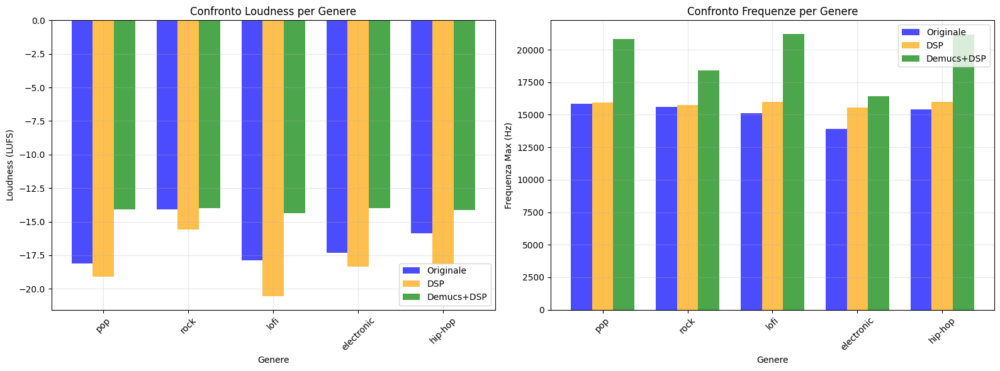


 Grafico salvato in: comparison_analysis.png


In [25]:
''' Crea DataFrame comparativi '''
def create_comparison_dataframes(original_stats, dsp_stats, demucs_stats):
    main_metrics_data = []
    main_metrics_data.append(["Loudness (LUFS)",
                             original_stats['general_stats']['mean_loudness_lufs'],
                             dsp_stats['general_stats']['mean_loudness_lufs'],
                             demucs_stats['general_stats']['mean_loudness_lufs'],
                             dsp_stats['general_stats']['mean_loudness_lufs'] - original_stats['general_stats']['mean_loudness_lufs'],
                             demucs_stats['general_stats']['mean_loudness_lufs'] - original_stats['general_stats']['mean_loudness_lufs']])

    main_metrics_data.append(["Frequenza Max (Hz)",
                             original_stats['general_stats']['mean_max_significant_frequency_hz'],
                             dsp_stats['general_stats']['mean_max_significant_frequency_hz'],
                             demucs_stats['general_stats']['mean_max_significant_frequency_hz'],
                             dsp_stats['general_stats']['mean_max_significant_frequency_hz'] - original_stats['general_stats']['mean_max_significant_frequency_hz'],
                             demucs_stats['general_stats']['mean_max_significant_frequency_hz'] - original_stats['general_stats']['mean_max_significant_frequency_hz']])

    main_metrics_data.append(["SNR (dB)",
                             original_stats['general_stats']['mean_snr_estimate_db'],
                             dsp_stats['general_stats']['mean_snr_real_db'],
                             demucs_stats['general_stats']['mean_snr_real_db'],
                             dsp_stats['general_stats']['mean_snr_real_db'] - original_stats['general_stats']['mean_snr_estimate_db'],
                             demucs_stats['general_stats']['mean_snr_real_db'] - original_stats['general_stats']['mean_snr_estimate_db']])

    main_metrics_data.append(["Sample Rate (Hz)", 32000, 32000, 44100, 0, 12100])

    # Crea un dataframe con i dati delle metriche originali
    main_df = pd.DataFrame(main_metrics_data,
                          columns=["Metrica", "Originale", "DSP", "Demucs+DSP", "Miglioramento_DSP", "Miglioramento_Demucs"])

    genres = list(original_stats['loudness_by_genre'].keys())
    loudness_data = []
    for genre in genres:
        loudness_data.append([
            genre,
            original_stats['loudness_by_genre'][genre],
            dsp_stats['loudness_by_genre'][genre],
            demucs_stats['loudness_by_genre'][genre],
            dsp_stats['loudness_by_genre'][genre] - original_stats['loudness_by_genre'][genre],
            demucs_stats['loudness_by_genre'][genre] - original_stats['loudness_by_genre'][genre]
        ])

    # Crea un dataframe per i dati della loudness per genere
    loudness_df = pd.DataFrame(loudness_data,
                              columns=["Genere", "Originale_LUFS", "DSP_LUFS", "Demucs+DSP_LUFS", "Miglioramento_DSP", "Miglioramento_Demucs"])

    freq_data = []
    for genre in genres:
        freq_data.append([
            genre,
            original_stats['freq_by_genre'][genre],
            dsp_stats['freq_by_genre'][genre],
            demucs_stats['freq_by_genre'][genre],
            dsp_stats['freq_by_genre'][genre] - original_stats['freq_by_genre'][genre],
            demucs_stats['freq_by_genre'][genre] - original_stats['freq_by_genre'][genre]
        ])

    # Crea un dataframe per i dati della frequency per genere
    freq_df = pd.DataFrame(freq_data,
                          columns=["Genere", "Originale_Hz", "DSP_Hz", "Demucs+DSP_Hz", "Miglioramento_DSP", "Miglioramento_Demucs"])

    return main_df, loudness_df, freq_df


''' Esporta i DataFrame in CSV '''
def export_to_csv(main_df, loudness_df, freq_df):
    # Esporta i singoli file CSV
    main_df.to_csv("comparison_main_metrics.csv", index=False, encoding='utf-8')
    loudness_df.to_csv("comparison_loudness_by_genre.csv", index=False, encoding='utf-8')
    freq_df.to_csv("comparison_frequency_by_genre.csv", index=False, encoding='utf-8')

    # Crea un file CSV combinato
    with open("complete_comparison_analysis.csv", 'w', newline='', encoding='utf-8') as f:
        writer = csv.writer(f)

        # Sezione metriche principali
        writer.writerow(["ANALISI COMPARATIVA - METRICHE PRINCIPALI"])
        writer.writerow(main_df.columns.tolist())  # Intestazione
        for row in main_df.values:
            writer.writerow(row)
        writer.writerow([])  # Riga vuota

        # Sezione loudness
        writer.writerow(["LOUDNESS PER GENERE"])
        writer.writerow(loudness_df.columns.tolist())  # Intestazione
        for row in loudness_df.values:
            writer.writerow(row)
        writer.writerow([])  # Riga vuota

        # Sezione frequenze
        writer.writerow(["FREQUENZE PER GENERE"])
        writer.writerow(freq_df.columns.tolist())  # Intestazione
        for row in freq_df.values:
            writer.writerow(row)

''' Genera report completo in JSON e CSV '''
def generate_complete_report(original_stats, dsp_stats, demucs_stats):
    # Crea DataFrame comparativi
    main_df, loudness_df, freq_df = create_comparison_dataframes(original_stats, dsp_stats, demucs_stats)

    # Esporta in CSV
    export_to_csv(main_df, loudness_df, freq_df)

    # Crea report JSON
    summary = {
        "timestamp": pd.Timestamp.now().isoformat(),
        "overall_improvement": {
            "loudness_improvement_dsp_db": float(dsp_stats['general_stats']['mean_loudness_lufs'] - original_stats['general_stats']['mean_loudness_lufs']),
            "loudness_improvement_demucs_db": float(demucs_stats['general_stats']['mean_loudness_lufs'] - original_stats['general_stats']['mean_loudness_lufs']),
            "frequency_improvement_dsp_hz": float(dsp_stats['general_stats']['mean_max_significant_frequency_hz'] - original_stats['general_stats']['mean_max_significant_frequency_hz']),
            "frequency_improvement_demucs_hz": float(demucs_stats['general_stats']['mean_max_significant_frequency_hz'] - original_stats['general_stats']['mean_max_significant_frequency_hz']),
            "sample_rate_upgrade": 44100 - 32000
        },
        "main_metrics": main_df.to_dict('records'),
        "loudness_by_genre": loudness_df.to_dict('records'),
        "frequency_by_genre": freq_df.to_dict('records')
    }

    with open("comparison_summary.json", 'w') as f:
        json.dump(summary, f, indent=2, ensure_ascii=False)

    return main_df, loudness_df, freq_df, summary

''' Visualizza anteprima dei DataFrame '''
def preview_dataframes(main_df, loudness_df, freq_df):
    print("=" * 100)
    print("          ANTEPRIMA DATI CSV CON MIGLIORAMENTI")
    print("=" * 100)

    print("\n METRICHE PRINCIPALI:")
    styled_main = main_df.copy()
    for col in ['Miglioramento_DSP', 'Miglioramento_Demucs']:
        styled_main[col] = styled_main[col].apply(
            lambda x: f"\033[92m{x:+.2f}\033[0m" if x > 0 else f"\033[91m{x:+.2f}\033[0m" if x < 0 else f"{x:+.2f}"
        )
    print(styled_main.to_string(index=False))

    print("\n LOUDNESS PER GENERE:")
    styled_loudness = loudness_df.copy()
    for col in ['Miglioramento_DSP', 'Miglioramento_Demucs']:
        styled_loudness[col] = styled_loudness[col].apply(
            lambda x: f"\033[92m{x:+.2f}\033[0m" if x > 0 else f"\033[91m{x:+.2f}\033[0m" if x < 0 else f"{x:+.2f}"
        )
    print(styled_loudness.to_string(index=False))

    print("\n FREQUENZE PER GENERE:")
    styled_freq = freq_df.copy()
    for col in ['Miglioramento_DSP', 'Miglioramento_Demucs']:
        styled_freq[col] = styled_freq[col].apply(
            lambda x: f"\033[92m{x:+.2f}\033[0m" if x > 0 else f"\033[91m{x:+.2f}\033[0m" if x < 0 else f"{x:+.2f}"
        )
    print(styled_freq.to_string(index=False))

''' Esecuzione '''
# Carica tutte le statistiche
with open("musicgen_dataset/musicgen_quality_stats.json", "r") as f:
    original_stats = json.load(f)

with open("dsp_enhanced/enhanced_audio_quality_stats.json", "r") as f:
    dsp_stats = json.load(f)

with open("demucs_mastered_audio/demucs_enhanced_quality_stats.json", "r") as f:
    demucs_stats = json.load(f)

# Genera report completo
main_df, loudness_df, freq_df, summary = generate_complete_report(original_stats, dsp_stats, demucs_stats)

# Mostra anteprima
preview_dataframes(main_df, loudness_df, freq_df)

# Statistiche finali
print("\n" + "=" * 100)
print(" RIEPILOGO MIGLIORAMENTI vs ORIGINALE:")
print("=" * 100)
print(f" Loudness DSP: {summary['overall_improvement']['loudness_improvement_dsp_db']:+.1f} dB")
print(f" Loudness Demucs: {summary['overall_improvement']['loudness_improvement_demucs_db']:+.1f} dB")
print(f" Frequenze DSP: {summary['overall_improvement']['frequency_improvement_dsp_hz']:+.0f} Hz")
print(f" Frequenze Demucs: {summary['overall_improvement']['frequency_improvement_demucs_hz']:+.0f} Hz")
print(f" Sample Rate: +{summary['overall_improvement']['sample_rate_upgrade']} Hz")

print(f"\n💾 File esportati:")
print("   - comparison_main_metrics.csv")
print("   - comparison_loudness_by_genre.csv")
print("   - comparison_frequency_by_genre.csv")
print("   - complete_comparison_analysis.csv")
print("   - comparison_summary.json")

print("\n✅ Analisi completata! I file CSV sono pronti per l'analisi.")

''' Grafici '''
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Grafico loudness per genere
genres = list(original_stats['loudness_by_genre'].keys())
orig_loudness = [original_stats['loudness_by_genre'][g] for g in genres]
dsp_loudness = [dsp_stats['loudness_by_genre'][g] for g in genres]
demucs_loudness = [demucs_stats['loudness_by_genre'][g] for g in genres]

x = np.arange(len(genres))
width = 0.25

axes[0].bar(x - width, orig_loudness, width, label='Originale', alpha=0.7, color='blue')
axes[0].bar(x, dsp_loudness, width, label='DSP', alpha=0.7, color='orange')
axes[0].bar(x + width, demucs_loudness, width, label='Demucs+DSP', alpha=0.7, color='green')
axes[0].set_xlabel('Genere')
axes[0].set_ylabel('Loudness (LUFS)')
axes[0].set_title('Confronto Loudness per Genere')
axes[0].set_xticks(x)
axes[0].set_xticklabels(genres, rotation=45)
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Grafico frequenze per genere
orig_freq = [original_stats['freq_by_genre'][g] for g in genres]
dsp_freq = [dsp_stats['freq_by_genre'][g] for g in genres]
demucs_freq = [demucs_stats['freq_by_genre'][g] for g in genres]

axes[1].bar(x - width, orig_freq, width, label='Originale', alpha=0.7, color='blue')
axes[1].bar(x, dsp_freq, width, label='DSP', alpha=0.7, color='orange')
axes[1].bar(x + width, demucs_freq, width, label='Demucs+DSP', alpha=0.7, color='green')
axes[1].set_xlabel('Genere')
axes[1].set_ylabel('Frequenza Max (Hz)')
axes[1].set_title('Confronto Frequenze per Genere')
axes[1].set_xticks(x)
axes[1].set_xticklabels(genres, rotation=45)
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('comparison_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

print(f"\n Grafico salvato in: comparison_analysis.png")